# Figures for paper

## Setup

In [2]:
%cd work/notebooks

/home/jovyan/work/notebooks


In [3]:
# Import modules and R
import numpy as np, pandas as pd
%load_ext rpy2.ipython
%load_ext autoreload
%autoreload 2

In [4]:
# Import local code
import sys
sys.path.append('/home/jovyan/work/code')
from gradientVersion import *
from processing_helpers import *
from analysis_helpers import *
from triplets import *
from mri_maps import *
from enrichments import *
from disorders import *
from brainspan import *
%R source("../code/Rplots.R");
%R source("../code/brainPlots.R");
%R source("../code/enrichmentsPlots.R");
%R source("../code/plot_maps.R");
%R source("../code/brainspanPlots.R");



Attaching package: ‘ggpp’



    annotate


System has not been booted with systemd as init system (PID 1). Can't operate.
Failed to connect to bus: Host is down
Attaching package: ‘ggh4x’



    stat_centroid



    geom_pointpath, GeomPointPath




### Compute versions

In [5]:
pca_base = gradientVersion(approach='pca', kernel=None).fit('hcp_base')
# pca_3d_ds7 = gradientVersion(approach='pca', kernel=None).fit('hcp_3donors_ds7')
# dme_ds8 = gradientVersion(approach='dm', kernel='normalized_angle', alpha=1).fit('hcp_ds8')
dme_3d_ds5 = gradientVersion(approach='dm', kernel='normalized_angle', alpha=1).fit('hcp_3donors_ds5')

New gradients version: method=pca, kernel=None, sparsity=0, data=hcp_base
New gradients version: method=dm, kernel=normalized_angle, sparsity=0, data=hcp_3donors_ds5


In [99]:
weights = dme_3d_ds5.weights.iloc[:,:3].set_axis(['G1','G2','G3'], axis=1)
null_weights = shuffle_gene_weights(weights, n=10000, rank=False)

Output scores and weights

In [50]:
# dm_hcp_ds8.clean_scores().to_csv('../outputs/ahba_dme_hcp_top3kgenes_scores.csv')
# dm_hcp_ds8.fit_weights().iloc[:,:3].set_axis(['G1','G2','G3'],axis=1).to_csv('../outputs/ahba_dme_hcp_top3kgenes_weights.csv')

# dm_hcp_3d_ds5.clean_scores().to_csv('../outputs/ahba_dme_hcp_top8kgenes_scores.csv')
dme_3d_ds5.fit_weights().iloc[:,:3].set_axis(['G1','G2','G3'],axis=1).to_csv('../outputs/ahba_dme_hcp_top8kgenes_weights.csv')

---

# Fig 1

### Region-region coexpression

In [6]:
version = dme_3d_ds5
expression_dict = {
    'Region co-expression (original)': version.expression.apply(lambda x: (x-np.mean(x))/np.std(x)),
    'Region co-expression (without G1)': regress_out_axes(version, 1),
    # 'Region co-expression (without G1-2)': regress_out_axes(version, 2),
    # 'Region co-expression (without G1-3)': regress_out_axes(version, 3)
}
coexp_dict = {name:get_coexp(expression) for name, expression in expression_dict.items()}

In [712]:
[get_graph_metric(coexp, nonnegative=True, threshold=None, metric='clustering') for coexp in coexp_dict.values()]

[0.18246471258837724,
 0.10988942617612221,
 0.08737399896838238,
 0.07901009771831223]

In [7]:
df_coexp = (pd.concat(coexp_dict)
    .melt(ignore_index=False)
    .rename_axis(['version', 'x'], axis=0)
    .set_axis(['y', 'r'], axis=1)
    .reset_index()
    .loc[lambda x: ~x['version'].str.contains('(2|3)',)]
)
df_coexp

/tmp/ipykernel_95737/899652529.py:6: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  .loc[lambda x: ~x['version'].str.contains('(2|3)',)]


,version,x,y,r
0,Region co-expression (original),0,0,1.000000
1,Region co-expression (original),1,0,0.440162
2,Region co-expression (original),2,0,0.606907
3,Region co-expression (original),3,0,0.533630
4,Region co-expression (original),4,0,0.456953
...,...,...,...,...
37533,Region co-expression (without G1),132,136,0.535061
37534,Region co-expression (without G1),133,136,0.468695
37535,Region co-expression (without G1),134,136,0.279505
37536,Region co-expression (without G1),135,136,0.449481


### Variance explained

In [743]:
print(pca_base.eigenvalues / pca_base.expression.var().sum())
print(dme_3d_ds5.eigenvalues / dme_3d_ds5.affinity.var(0).sum())

df_var = (pd.DataFrame(dme_3d_ds5.eigenvalues / dme_3d_ds5.affinity.var(0).sum())
          .assign(PC = range(1,6))
          .rename({0:'var'}, axis=1)
        #   .reset_index().set_axis(['PC','var'],axis=1))
)
df_var

[0.22943097 0.10049243 0.0821488  0.06295774 0.05351861]
[0.22125231 0.07861128 0.06043815 0.03903289 0.03420971]


,var,PC
0,0.221252,1
1,0.078611,2
2,0.060438,3
3,0.039033,4
4,0.034210,5


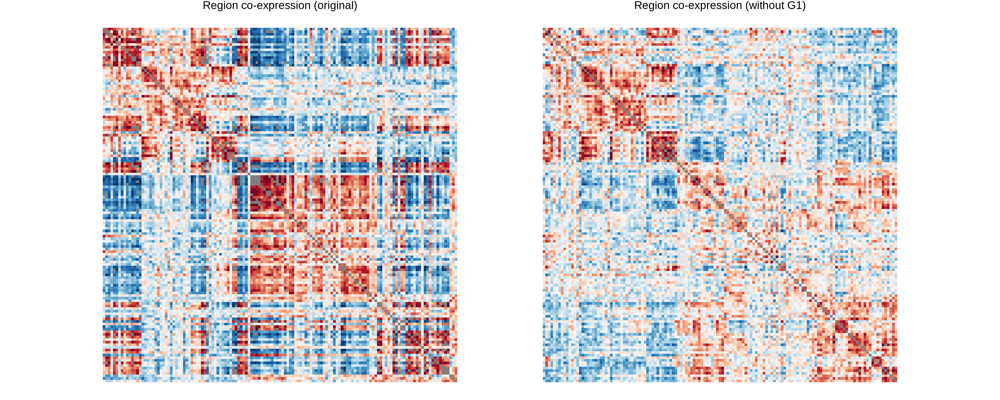

In [10]:
%%R -i df_coexp -w 20 -h 8 --units in -r 200
source("../code/Rplots.R")
# g1 <- df_var %>% plot_var_exp
plot_coexp(df_coexp)
# (g1 | g2) + plot_layout(widths=c(1,2))

### Axes & simple triplets

In [6]:
versions_scores = pd.concat({
   'pca_base' : pca_base.clean_scores(),
   'dme_3d_ds5' : dme_3d_ds5.clean_scores(),
}).reset_index(level=0).rename({'level_0':'version'},axis=1)

names_dict = {
    'pca_base':"PCA, all genes\nall regions",
    'dme_3d_ds5':"DME, top 50% genes\nonly 3+ donor regions"
}
versions_scores = versions_scores.assign(version = lambda x: x['version'].map(names_dict))

In [7]:
triplets_dict = load_pickle('triplets_dict')

In [8]:
triplets_df = pd.concat({
    "PCA, all genes\nall regions": triplets_dict['PCA, all regions'].loc[lambda x: x['version']==0],
    "DME, top 50% genes\nonly 3+ donor regions": triplets_dict['DME, only 3+ donor regions'].loc[lambda x: x['version']==0.5]
}).drop('version', axis=1).reset_index(0).rename({'level_0':'version'}, axis=1)
# triplets_df

In [9]:
triplets_df.groupby(['version','how','component']).median()

corr  \
version                                   how           component             
DME, top 50% genes\nonly 3+ donor regions Region scores 1          0.956244   
                                                        2          0.657189   
                                                        3          0.649015   
                                                        4         -0.091823   
                                                        5         -0.016654   
PCA, all genes\nall regions               Region scores 1         -0.191852   
                                                        2          0.068152   
                                                        3          0.032535   
                                                        4         -0.112639   
                                                        5          0.033330   

                                                                   corr_abs  
version                                   how           component            
DME, top 50% genes\nonly 3+ donor regions Region scores 1          0.956244  
                                                        2          0.726947  
                                                        3          0.649015  
                                                        4          0.279736  
                                                        5          0.332485  
PCA, all genes\nall regions               Region scores 1          0.721299  
                                                        2          0.118019  
                                                        3          0.112725  
                                                        4          0.145198  
                                                        5          0.298828

### Brainspan mapping

In [10]:
hcp_bs_mapping = get_hcp_bs_mapping_v2()

In [11]:
bs_exp, bs_col, bs_row = get_brainspan()
bs_clean = clean_brainspan(bs_exp, bs_col, bs_row, hcp_bs_mapping)
bs_agg = aggregate_brainspan_by_age(bs_clean)

/opt/conda/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


In [12]:
bs_clean.groupby(['donor_id', 'age']).size().loc[lambda x: x>3].sort_index(level=1).shape

(35,)

### Brainspan development

In [13]:
hcp_mapped_scores = get_mapped_scores(dme_3d_ds5, hcp_bs_mapping)
bs_scores = compute_brainspan_scores(bs_agg, dme_3d_ds5)

/opt/conda/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


In [14]:
age_groups = get_age_groups()
bs_scores_corr = correlate_brainspan_scores(bs_scores, hcp_mapped_scores, age_groups=age_groups)

In [15]:
bs_scores_corr.sort_values('age')

,age,G,corr
0,Pre-Birth,G1,0.736153
3,Pre-Birth,G2,0.665083
6,Pre-Birth,G3,0.288288
1,Birth-13 yrs,G1,0.874891
4,Birth-13 yrs,G2,0.909309
7,Birth-13 yrs,G3,0.472086
2,18-40 yrs,G1,0.957970
5,18-40 yrs,G2,0.881572
8,18-40 yrs,G3,0.837530


### Brainspan adult correlation

In [16]:
both_scores, both_corrs = combine_scores(bs_scores, hcp_mapped_scores, age_groups)

In [17]:
scores_plot = make_brain_plots(dme_3d_ds5, hcp_bs_mapping, bs_scores).replace({'version':{'BrainSpan':'BrainSpan 18-40yrs'}})

`geom_smooth()` using formula = 'y ~ x'


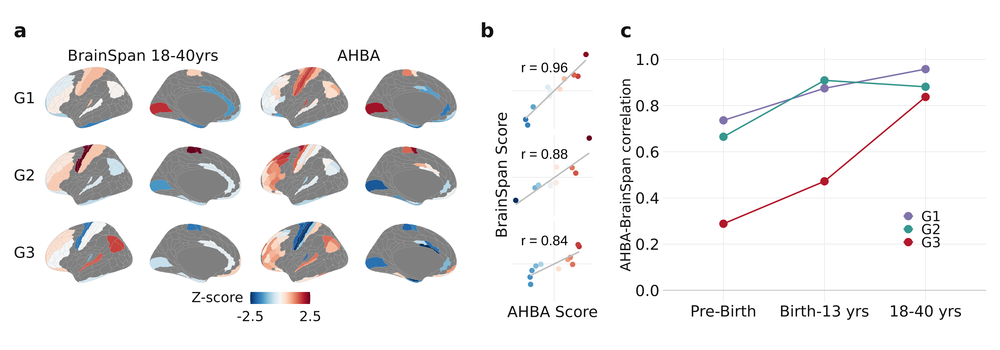

In [18]:
%%R -w 20 -h 7 --units in -r 200 -i hcp_bs_mapping -i both_scores -i both_corrs -i scores_plot -i bs_scores_corr
source("../code/Rplots.R")
source("../code/brainspanPlots.R")
source("../code/brainPlots.R")

# g10 <- plot_bs_hcp_mapping(hcp_bs_mapping, xlab='BrainSpan regions\nmatched to HCP-MMP1.0') + theme(plot.margin=margin(r=-50, 'pt'), plot.tag.position=c(0,.95))
g11 <- plot_hcp(scores_plot,  switch='y') + theme(
            plot.tag.position = c(0.1, .9),
            strip.text.x=element_text(size=22), 
            strip.text.y.left=element_text(size=22, margin=margin(l=0)),
            legend.position=c(.5,-.1),
            legend.direction='horizontal',
            legend.title=element_text(vjust=1),
            panel.spacing.y = unit(1, 'lines')
            )
g12 <- plot_ahba_bs_scatter(both_scores, both_corrs, facet='v', size=3) + theme(
            strip.text.y = element_blank(),
            axis.title.y = element_text(angle=90,size=22, color='grey7', family='Calibri'),
            axis.title.x=element_text(size=22, color='grey7', family='Calibri')
)
g13 <- plot_bs_scores_corr(bs_scores_corr) + 
    theme(legend.position=c(.8,.3), plot.tag.position = c(0, .95),
          axis.text=element_text(size=22, color='grey7', family='Calibri')
         )
    
layout <- c(
    # area(t=1,b=24,l=1,r=8),
    # area(t=1,b=24,l=9,r=30),
    area(t=1,b=24,l=1,r=24),
    area(t=1,b=24,l=25,r=30),
    area(t=1,b=24,l=31,r=48)
)

# plot <- g10 + g11 + g12 + g13 + plot_layout(design=layout)
plot <- g11 + g12 + g13 + plot_layout(design=layout)

themed <- plot & theme(
    text=element_text(size=20, color='grey7', family='Calibri'), 
    # axis.text=element_text(size=20, color='grey7', family='Calibri'),
    legend.text=element_text(size=20, color='grey7', family='Calibri'),
    plot.margin = margin(t=10, r=10, b=10, l=10, "pt"),
    plot.tag.position = c(0, .95),
    plot.tag = element_text(size=28, face='bold', family='Calibri', hjust=0)
)

g_brainspan = themed + plot_annotation(tag_level='a')
g_brainspan

## New simple fig

/opt/conda/lib/python3.10/site-packages/rpy2/robjects/pandas2ri.py:56: UserWarning: DataFrame contains duplicated elements in the index, which will lead to loss of the row names in the resulting data.frame
  warnings.warn('DataFrame contains duplicated elements in the index, '



`geom_smooth()` using formula = 'y ~ x'


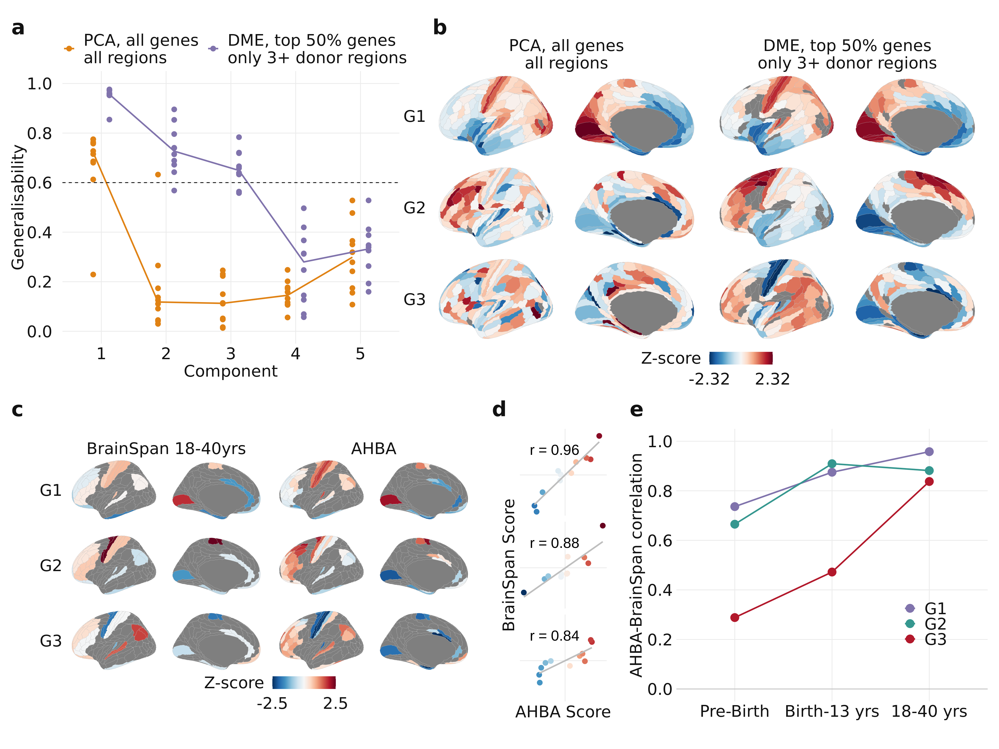

In [19]:
%%R -i versions_scores -i triplets_df -w 48 -h 36 --units cm -r 200
source("../code/Rplots.R")

g1 <- triplets_df %>% 
    mutate(version=factor(version, ordered=T, levels=unique(.$version))) %>% 
    ggplot(aes(x=component, y=corr_abs, fill=version)) + 
    geom_point(aes(color=version), position=position_dodge(width = 0.5), size=3) +
    stat_summary(geom='line', size=1, fun=median, position=position_dodge(width = 0.5), 
                aes(color=version, group=version)) +
    scale_color_manual(values=brewer.puor(10)[c(3,8)]) +
    scale_y_continuous(limits=c(0,1), breaks=seq(0,1,.2)) +
    geom_hline(yintercept=.6, linetype='dashed') +
    ylab('Generalisability') + xlab('Component') +
    theme_minimal() + 
    theme(
      plot.tag.position = c(0,.95),
      axis.text=element_text(size=22, color='grey7', family='Calibri'), 
      axis.text.y=element_text(margin=margin(0,-20,0,0,'pt')),
      axis.title.y=element_text(margin=margin(0,0,0,0,'pt')),
      panel.grid.minor = element_blank(),
      legend.title = element_blank(),
      legend.spacing.y = unit(3, 'pt'),
      # legend.position = c(.5, 1),
      legend.margin=margin(0,0,-50,0, 'pt'),
      legend.position='top'
      # aspect.ratio=1
    )

g2 <- plot_hcp(versions_scores) + 
  theme(
      plot.tag.position = c(0.05,.95),
      legend.position=c(.5,-.1),
      legend.direction='horizontal',
      legend.title=element_text(vjust=1))

# g3 <- plot_var_exp(df_var) + 
#     theme(
#       axis.text.y = element_text(margin=margin(0,-15,0,0))
#       # axis.title.y = element_text(margin=margin(0,0,0,0))
#     )
# g4 <- plot_coexp(df_coexp)

layout <- c(
  area(t = 1, b = 18, l = 1, r = 18),
  area(t = 1, b = 18, l = 19, r = 48),
  # area(t = 19, b = 32, l = 1, r = 15),
  # area(t = 19, b = 32, l = 16, r = 48),
  area(t = 19, b = 36, l = 1, r = 48)
)

plot <- g1 + g2 + g_brainspan + plot_layout(design=layout)

themed <- plot & theme(
    text=element_text(size=22, color='grey7', family='Calibri'), 
    # axis.text=element_text(size=22, color='grey7', family='Calibri'), 
    strip.text=element_text(size=22, color='grey7', family='Calibri'),
    legend.text=element_text(size=22, color='grey7', family='Calibri'),
    # plot.margin = margin(t=10, r=10, b=10, l=10, "pt"),
    # plot.tag.position = c(0, 1),
    plot.tag = element_text(size=28, face='bold', family='Calibri', hjust=0)
)


annotated <- themed + plot_annotation(
  tag_level='a',
  theme = theme(plot.caption = element_textbox_simple(size = 20, padding = unit(c(40, 5, 5, 5), "pt")))
)
annotated

### Cross-correlation

In [ ]:
# Scores
dm_hcp_3d_ds5.clean_scores().corr()

,G1,G2,G3
G1,1.000000e+00,4.792989e-08,-2.059994e-07
G2,4.792989e-08,1.000000e+00,3.827356e-08
G3,-2.059994e-07,3.827356e-08,1.000000e+00


In [238]:
# Weights
dme_3d_ds5.weights.iloc[:,:3].set_axis(['G1','G2','G3'],axis=1).corr()

,G1,G2,G3
G1,1.000000,-0.038905,-0.018472
G2,-0.038905,1.000000,-0.104597
G3,-0.018472,-0.104597,1.000000


### Smoothness (Moran's I)

In [217]:
versions_scores.iloc[:,:4].groupby('version', sort=False).agg(get_moran_I).T

version,"PCA, all genes\nall regions","DME, top 50% genes\nonly 3+ donor regions"
G1,0.497240,0.485266
G2,0.227112,0.583124
G3,-0.006063,0.206305


### Correlated genes

In [242]:
(dme_3d_ds5.weights > 0.4).sum()

0    2736
1     978
2     523
3     158
4      76
dtype: int64

### XYZ corrs

In [237]:
xyz_1 = fetch_hcp()['info'].loc[:179,['x-cog','y-cog','z-cog']]
xyz_2 = pd.read_csv("../data/stat_maps_HCP_forRichard.csv").loc[:,['x','y','z']]
xyz_1.join(xyz_2).corr()

,x-cog,y-cog,z-cog,x,y,z
x-cog,1.000000,-0.103109,-0.267106,0.996445,0.115058,-0.265170
y-cog,-0.103109,1.000000,-0.174574,-0.080179,-0.999126,-0.182202
z-cog,-0.267106,-0.174574,1.000000,-0.265063,0.163484,0.998760
x,0.996445,-0.080179,-0.265063,1.000000,0.091809,-0.263050
y,0.115058,-0.999126,0.163484,0.091809,1.000000,0.171283
z,-0.265170,-0.182202,0.998760,-0.263050,0.171283,1.000000


In [214]:
def get_xyz_corrs(version):
    hcp_xyz = fetch_hcp()['info'].loc[:180,['id','x-cog','y-cog','z-cog']].set_index('id').set_axis(['x','y','z'],axis=1)
    return version.clean_scores().join(hcp_xyz).corr().iloc[3:,:3]

get_xyz_corrs(dme_3d_ds5)

,G1,G2,G3
x,0.031297,-0.072152,0.387011
y,-0.636929,0.495426,-0.031252
z,0.535922,0.579142,-0.164137


In [215]:
get_xyz_corrs(dme_3d_ds5).corr()

,G1,G2,G3
G1,1.000000,0.038036,-0.152154
G2,0.038036,1.000000,-0.993429
G3,-0.152154,-0.993429,1.000000


---

# Fig 2

### Get maps

In [838]:
maps = get_maps()
hcp_scores = dme_3d_ds5.clean_scores()
corrs = get_corrs(hcp_scores, maps, method='pearson')
corrs

,G1,G2,G3
paquola_FC,0.779721,-0.013573,0.005070
T1T2,0.737294,-0.164209,0.274928
MEG_theta,-0.179691,0.781434,0.020574
glasser_GI,0.178841,0.658771,-0.182084
d_intramodular_dist60,0.193709,-0.035655,0.416997
dMT,0.192559,0.173221,-0.423026
dCT,-0.187204,-0.241795,0.049635
hill_evo,-0.197446,0.448212,-0.313722
hill_dev,-0.076473,0.438694,-0.106841
externopyramidisation,0.082986,-0.568378,-0.158948


In [ ]:
null_grads = np.load("../outputs/permutations/hcp_3d_ds5_spin_5000.npy")
null_p = corr_nulls_from_grads(null_grads, hcp_scores, maps, method='pearsonr', adjust='fdr_bh')

In [ ]:
long_names = {
        'T1T2':'Myelination (T1w/T2w)',
        'thickness':'Thickness (CT)',    
        'G1_fMRI': 'fMRI connectivity G1',
        'PC1_neurosynth': 'NeuroSynth PC1 (NS PC1)',    
        #'glasser_CMRO2':'Oxy. Metabolism (CMRO2)',
        # 'glasser_CMRGlu':'Glu. Metabolism (CMRGlu)',
        'allom':'Allometric Scaling (Allom.)',  
        'glasser_GI':'Aerobic Glycolysis (AG)',
        'hill.evo_remapped':'Evolutionary Expansion (Evo. Exp.)',
        'hill.dev_remapped':'Dev. Expansion (Dev. Exp.)',
        'glasser_CBF':'Cerebral Blood Flow (CBF)',
        'externopyramidisation':'Externopyramidisation (Ext.)'
}
    
short_names = {
        'T1T2':'T1w/T2w',
        'thickness':'CT',
        'G1_fMRI':'fMRI G1',
        'PC1_neurosynth':'NS PC1',    
        # 'glasser_CMRO2':'CMRO2',
        # 'glasser_CMRGlu':'CMRGlu',
        'glasser_GI':'AG',
        'hill.dev_remapped':'Dev. Exp.',
        'hill.evo_remapped':'Evo. Exp.',
        'externopyramidisation':'Ext.',
        'glasser_CBF':'CBF',
        'allom':'Allom.'
}
null_p_rename = (null_p
        .set_index('map').loc[long_names.keys()].reset_index()
        .assign(map = lambda x: x['map'].map(short_names))
)
maps_rename = maps.rename(columns=long_names).loc[:,long_names.values()]

### Scatter

In [ ]:
# maps_scatter_names = {
#     # 'Myelination (T1w/T2w)':'Myelination\n(T1w/T2w)',
#     'Oxygen Metabolism (CMRO2)':'Oxygen\nMetabolism',
#     'Glycolytic Index (AG)':'Glycolytic\nIndex'
# }
# maps_scatter = (maps
#                 .loc[:,maps_scatter_names.keys()]
#                 .melt(ignore_index=False, var_name='map', value_name='map_score')
#                 .join(hcp_scores.set_index('label')).reset_index()
#                 .replace({'map':maps_scatter_names})
#                 .drop('G3',axis=1)
#                )
# maps_scatter_corrs = (null_p.query("map in @maps_scatter_names.keys()")
#                       .loc[:,['map','G','true_mean','q']]
#                       .replace({'map':maps_scatter_names})
#                       .loc[lambda x: x['G'] != 'G3']
#                      )

### PCA

In [ ]:
pca_scores, pca_var, pca_weights = maps_pca(maps, short_names)
pca_scores = (pca_scores.iloc[:,[0,1]] * [-1,-1]).reset_index()

In [ ]:
pca_weights

,MRI PC1,MRI PC2,MRI PC3,map_name
T1T2,0.332366,-0.409737,0.207512,T1w/T2w
thickness,-0.192132,0.457254,-0.265105,CT
G1_fMRI,-0.419280,0.281886,0.375155,fMRI G1
PC1_neurosynth,-0.052920,0.418097,0.607794,NS PC1
externopyramidisation,0.321587,0.248761,-0.020594,Ext.
glasser_GI,-0.414454,-0.258373,0.294931,AG
hill.evo_remapped,-0.385018,-0.027477,-0.410459,Evo. Exp.
hill.dev_remapped,-0.379048,-0.062994,-0.170270,Dev. Exp.
glasser_CBF,-0.179644,-0.416512,0.285869,CBF
allom,-0.273211,-0.248848,-0.099529,Allom.


In [ ]:
pca_var

array([0.31103521, 0.19970867, 0.14094252])

In [ ]:
ahba_scores = hcp_scores.drop('G3', axis=1).set_axis(['G1', 'G2', 'label'], axis=1)

In [ ]:
maps_pca_scatter = (pd.concat({
    'MRI PCA': pca_scores.set_axis(['label','G2','G1'],axis=1).set_index('label'),
    'AHBA DM': hcp_scores.drop('G3', axis=1).set_index('label')}, 
    axis=1)
 .stack(1).reset_index().rename({'level_1':'G'},axis=1)
 .replace({'G':{'G1':'MRI PC2 vs G1', 'G2':'MRI PC1 vs G2'}})
 .sort_values('G')
)
# maps_pca_scatter

In [ ]:
pca_corrs = get_corrs(hcp_scores, pca_scores.set_index('label'))
pca_null_p = corr_nulls_from_grads(null_grads, hcp_scores, pca_scores.set_index('label'), method='pearsonr', adjust=None)
maps_pca_corrs = (pca_null_p
                     .loc[:,['map','G','r','q']]
                     .loc[lambda x: (x['G']=='G1') & (x['map']=='MRI PC2') | 
                                    (x['G']=='G2') & (x['map']=='MRI PC1')]
                     .replace({'G':{'G1':'MRI PC2 vs G1', 
                                    'G2':'MRI PC1 vs G2'}})
                    )

In [ ]:
pca_null_p

,G,map,r,p,q
0,G1,MRI PC1,-0.287347,0.381524,0.381524
1,G1,MRI PC2,0.711864,0.002999,0.002999
2,G2,MRI PC1,0.591979,0.013397,0.013397
3,G2,MRI PC2,0.363258,0.481504,0.481504
4,G3,MRI PC1,-0.277051,0.185963,0.185963
5,G3,MRI PC2,0.211593,0.361928,0.361928


In [ ]:
# %%R -i maps_pca_scatter -i maps_pca_corrs
# source("../code/plot_maps.R")
# plot_maps_pca_scatter(maps_pca_scatter, maps_pca_corrs)

### Mesulam

In [ ]:
hcp_scores = dme_3d_ds5.clean_scores()
null_scores = np.load('../outputs/permutations/hcp_3d_ds5_spin_5000.npy')

In [ ]:
mesulam_ve_yeo = (pd.read_csv('../data/mesulam_ve_yeo.csv', index_col=0).join(hcp_scores.set_index('label'), on='label')
                  .loc[lambda x: x['Mesulam']!=0])
true_means, null_means = compute_region_means(hcp_scores, null_scores, mesulam_ve_yeo['Mesulam'], method='mean')
mesulam_scores_sig = compute_null_p(true_means, null_means, adjust='fdr_bh').assign(label=lambda x: x['label'].astype('string'))
mesulam_colors = (mesulam_ve_yeo.loc[:,['Mesulam', 'Mesulam_names', 'Mesulam_colors']].set_axis(['label','name','color'],axis=1)
                  .drop_duplicates().assign(label=lambda x: x['label'].astype('string')))
mesulam_scores_sig = mesulam_scores_sig.join(mesulam_colors.set_index('label'), on='label')

In [ ]:
mesulam_scores_sig

,label,G,pct,true_mean,null_mean,null_std,z,pos,p,q,sig,name,color
0,4,G1,0.9964,1.137121,0.187509,0.412181,2.303869,True,0.0072,0.021600,True,Idiotypic,#80B1D3
1,4,G2,0.7164,0.246756,-0.039885,0.421888,0.679423,True,0.5672,0.826080,False,Idiotypic,#80B1D3
2,4,G3,1.0000,1.291594,0.176610,0.340500,3.274554,True,0.0000,0.000000,True,Idiotypic,#80B1D3
3,3,G1,0.5020,0.221314,0.203251,0.268862,0.067182,True,0.9960,0.996000,False,Unimodal,#FB8072
4,3,G2,0.4794,-0.064397,-0.039556,0.263821,-0.094158,False,0.9588,0.996000,False,Unimodal,#FB8072
5,3,G3,0.0120,-0.257853,0.170219,0.217599,-1.967248,False,0.0240,0.057600,False,Unimodal,#FB8072
6,1,G1,0.0000,-1.188135,0.200265,0.548535,-2.531105,False,0.0000,0.000000,True,Paralimbic,#FFFFB3
7,1,G2,0.3298,-0.431127,-0.064325,0.593449,-0.618086,False,0.6596,0.826080,False,Paralimbic,#FFFFB3
8,1,G3,0.8678,0.584761,0.167781,0.353354,1.180064,True,0.2644,0.453257,False,Paralimbic,#FFFFB3
9,2,G1,0.3442,0.111147,0.203365,0.198798,-0.463881,False,0.6884,0.826080,False,Heteromodal,#BEBADA


### Fig

In [ ]:
pca_scores

,label,MRI PC1,MRI PC2
0,V1,-2.026054,1.161975
1,MST,-0.722917,0.845834
2,V6,-1.262592,1.333013
3,V2,-1.910390,0.941732
4,V3,-1.671805,0.568509
...,...,...,...
175,STSva,0.575454,-1.713953
176,TE1m,1.565298,-0.767749
177,PI,-0.824257,-1.063287
178,a32pr,1.206591,-0.073638


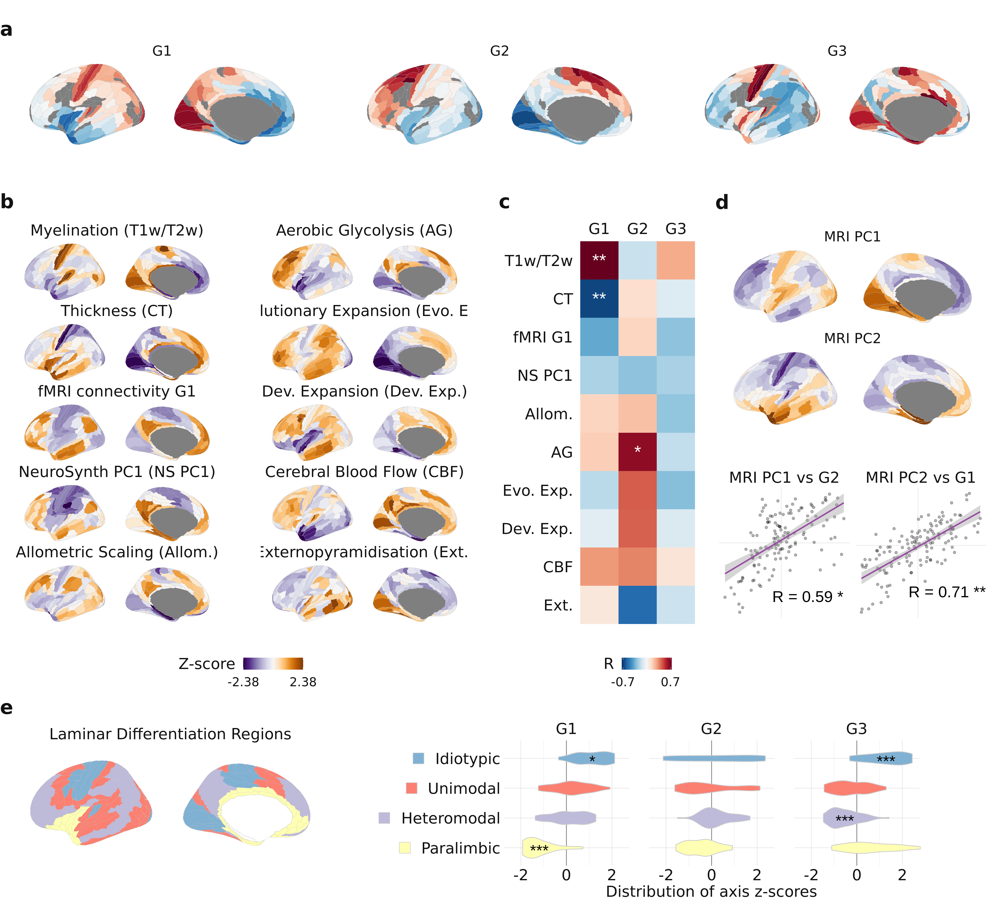

In [ ]:
%%R -w 20 -h 18 --units in -r 200 -i hcp_scores -i maps_rename -i null_p_rename -i pca_weights -i pca_scores -i ahba_scores -i maps_pca_scatter -i maps_pca_corrs -i mesulam_ve_yeo -i mesulam_scores_sig
source("../code/plot_maps.R")
source("../code/Rplots.R")

g1 <- plot_hcp_wide(hcp_scores) + guides(fill='none') + theme(legend.margin=margin(t = -40, unit='pt'),
                                                              plot.tag.position = c(0, .95))
g2 <- plot_maps(maps_rename, ncol=2, colors=rev(brewer.puor(100)), spacing=0) + theme(
            legend.position='bottom',
            # legend.margin=margin(t = -60, unit='pt'),
            panel.spacing.x = unit(4, 'lines'),
            plot.tag.position = c(0, .95))
g3 <- plot_map_corrs(null_p_rename, size=9) + theme(
            # legend.margin=margin(t = -60, unit='pt'),
            plot.tag.position = c(0.1, .95)) & theme(axis.text=element_text(size=22))
g4 <- plot_ahba_mri_brains(pca_scores, colors=brewer.puor(100), ncol=1) + theme(plot.tag.position = c(0,.9))
g5 <- plot_maps_pca_scatter(maps_pca_scatter, maps_pca_corrs, size=8, ncol=2, x=1, y=-2) + plot_layout(tag_level='new')

g6 = plot_hcp_classes(mesulam_ve_yeo, classes=Mesulam, classcolors=Mesulam_colors, classnames=Mesulam_names, ncol=4) +
    ggtitle('Laminar Differentiation Regions') + 
    theme(legend.position='none', 
          plot.title=element_text(hjust=0.5, size=22, color='grey7', family='Calibri',margin=margin(b=-50)),
          )
g6b = plot_atlas_violins(mesulam_ve_yeo, mesulam_scores_sig) + plot_layout(tag_level='new') +
    theme(strip.text=element_text(size=22, color='grey7', family='Calibri'))

layout <- c(
  # Axes
  area(t = 1, b = 9, l = 1, r = 48),    
  # All maps
  area(t = 10, b = 38, l = 1, r = 22),
  # All corrs
  area(t = 10, b = 38, l = 23, r = 31),
  # PCA brains
  area(t = 10, b = 25, l = 32, r = 48),
  # PCA-AHBA scatter
  area(t = 27, b = 38, l = 32, r = 48),
  # Mesulam brains
  area(t = 39, b = 48, l = 1, r = 20),
  # # Mesulam enrichments
  area(t = 39, b = 48, l = 21, r = 48)

)

# plot <- g1 + g2 + g3 + g4 + g5 + plot_layout(design=layout)
plot <- g1 + g2 + g3 + g4 + g5 + g6 + g6b + plot_layout(design=layout)

(plot & theme(
    text=element_text(size=22, color='grey7', family='Calibri'), 
    strip.text=element_text(size=22, color='grey7', family='Calibri'),
    # legend.text=element_text(size=22, color='grey7', family='Calibri'),
    plot.margin = margin(t=10, r=10, b=0, l=0, "pt"),
    # plot.tag.position = c(0, 1),
    plot.tag = element_text(size=28, face='bold', family='Calibri', hjust=0, vjust=1)
)) + plot_annotation(tag_level='a')

---

# Fig 3

In [28]:
scores = dme_3d_ds5.clean_scores()

Genes associated with longitudinal structural change? From https://www.nature.com/articles/s41593-022-01042-4#Sec5

In [248]:
weights.rank().loc['DACH1',:]
# weights.rank().loc['APOE',:]

G1    4317.0
G2    7843.0
G3    6364.0
Name: DACH1, dtype: float64

In [268]:
pca_base.weights.rank().loc[lambda x: x.index.str.contains('SV2A'),:]

,0,1,2,3,4
SV2A,15262.0,4553.0,4117.0,9136.0,1648.0


In [274]:
# weights.rank().loc[lambda x: x.index.str.contains('C4A'),:]
# pca_base.weights.rank().loc[lambda x: x.index.str.contains('C4A'),:]

### Single cell

In [331]:
sc_axes_posneg_plot = format_single_cell_data_for_plot()
cell_rename = {
    'Neuron-Ex':'N-Ex',
    'Neuron-In':'N-In',
    'Astrocyte':'Astro',
    'Microglia':'Micro',
    'Endothelial':'Endo',
    'Oligodendrocyte':'Oligo',
    'OPC':'OPC'
}
sc_axes_posneg_plot = sc_axes_posneg_plot.replace({'cell_type':cell_rename})

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


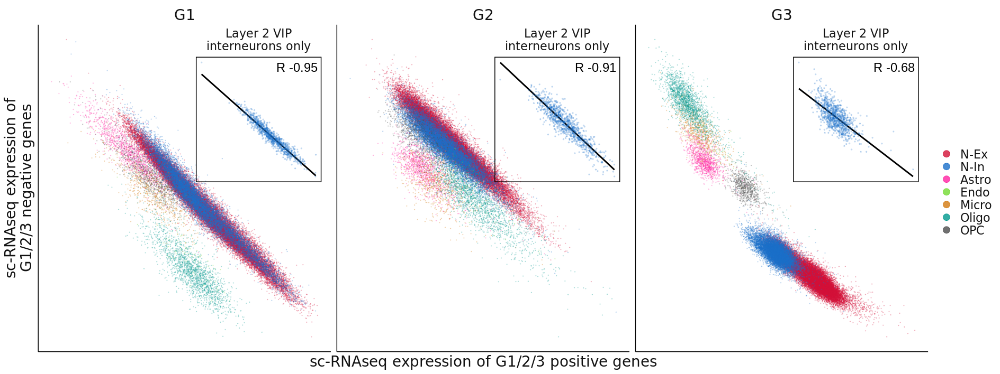

In [432]:
%%R -i sc_axes_posneg_plot -w 48 -h 18 -u cm -r 100
source("../code/Rplots.R")
g_singlecell <- plot_single_cell_posneg(sc_axes_posneg_plot) # + theme(legend.position='bottom')
g_singlecell

### Layer enrichments

In [296]:
layer_genes = get_layer_genes(which='maynard', add_hse_genes=True)
layer_stats = compute_null_p(*compute_enrichments(weights, null_weights, layer_genes))
layer_stats

,label,G,pct,true_mean,null_mean,null_std,z,pos,p,q,sig,n_genes,n_matches
0,HSE,G1,0.9813,0.240519,-0.031477,0.132211,2.057285,True,0.0374,0.044880,True,19,19
1,HSE,G2,0.9982,0.231203,0.025380,0.072432,2.841611,True,0.0036,0.005400,True,19,19
2,HSE,G3,0.9960,0.161705,0.006231,0.059285,2.622491,True,0.0080,0.011294,True,19,19
3,L1,G1,0.0000,-0.292059,-0.033180,0.022169,-11.677341,False,0.0000,0.000000,True,1405,643
4,L1,G2,0.5018,0.025873,0.025904,0.011890,-0.002613,True,0.9964,0.996400,False,1405,643
5,L1,G3,0.0000,-0.162459,0.006166,0.009785,-17.233593,False,0.0000,0.000000,True,1405,643
6,L2,G1,0.0000,-0.258819,-0.033026,0.021354,-10.573961,False,0.0000,0.000000,True,1093,689
7,L2,G2,0.0000,-0.128960,0.026052,0.011615,-13.345495,False,0.0000,0.000000,True,1093,689
8,L2,G3,1.0000,0.211150,0.005990,0.009367,21.903142,True,0.0000,0.000000,True,1093,689
10,L3,G2,0.6991,0.044462,0.026487,0.034126,0.526738,True,0.6018,0.627965,False,139,85


### Cell enrichments

In [302]:
cell_genes = get_cell_genes(which='jakob', add_synapses=True)
order = ['Synapses', 'Neuro-Ex', 'Neuro-In', 'Astro', 'Micro', 'Endo', 'Oligo', 'OPC']
true_scores, null_scores, counts = compute_enrichments(weights, null_weights, cell_genes, how='mean')
cell_stats = compute_null_p(true_scores, null_scores, adjust='fdr_bh', order=order)

In [312]:
cell_rename = {
    'Synapses':'Syn',
    'Neuro-Ex':'N-Ex',
    'Neuro-In':'N-In',
    'Astro':'Astro',
    'Micro':'Micro',
    'Endo':'Endo',
    'Oligo':'Oligo',
    'OPC':'OPC'
}
# cell_rename = {v:k for k,v in cell_rename.items()}
    
cell_stats = cell_stats.replace({'label':cell_rename}).sort_values(['label','G'])


### GWAS enrichments

In [407]:
gwas_int = (pd.read_csv("../data/gwas/intelligence.csv", header=0)
 .drop('sniekers2017', axis=1)
 .melt(var_name='label',value_name='gene').dropna()
)
gwas_stats = compute_null_p(*compute_enrichments(weights, null_weights, gwas_int))

In [408]:
gwas_rename = {
    'hill2019':'Hill et al 2019',
    'davies2018':'Davies 2018',
    'savage2018':'Savage 2018',
    'hatoum2022':'Hatoum 2022',
}
gwas_stats = gwas_stats.replace({'label':gwas_rename}).sort_values(['label','G'])

### GO enrichments

In [59]:
go_enrichments = combine_enrichments('dm_hcp_3d_ds5', 'Process', include_g1=False, top_n=5, filter_001=False) 
go_enrichments = go_enrichments.replace({'G':{
    'G1':'G1: Translation', 
    'G2':'G2: Metabolic vs Regulatory', 
    'G3':'G3: Synaptic vs Immunity'}})

In [34]:
(combine_enrichments('dm_hcp_3d_ds5', 'Process', include_g1=False, top_n=10, filter_001=False)
    .loc[lambda x: x['FDR']<0.05].sort_values(['G', 'direction','rank'])
)

,G,description,n_genes,direction,enrichment,FDR,neglogFDR,rank
18,G2,Mitochondrial translation,47,bottom,2.63259,0.008000,2.096910,1.0
17,G2,Secondary alcohol metabolic process,60,bottom,1.98840,0.007100,2.148742,2.0
14,G2,Alcohol metabolic process,163,bottom,1.41172,0.007100,2.148742,3.0
11,G2,ATP metabolic process,72,bottom,2.32397,0.004400,2.356547,4.0
8,G2,Sterol biosynthetic process,27,bottom,3.18342,0.004400,2.356547,5.0
7,G2,Energy derivation by oxidation,99,bottom,1.98459,0.004400,2.356547,6.0
4,G2,Steroid biosynthetic process,62,bottom,2.24300,0.003400,2.468521,7.0
3,G2,Steroid metabolic process,105,bottom,1.61331,0.002600,2.585027,8.0
2,G2,Mitochondrion organization,181,bottom,1.49670,0.002000,2.698970,9.0
0,G2,Generation of precursor metabolites and energy,179,bottom,1.83935,0.000650,3.187087,10.0


### Age curves

In [35]:
curves = get_brainspan_curves_by_gene(genes=weights.index)

In [39]:
q=10
quantiles = (weights.set_axis(['G1','G2','G3'], axis=1)
             .melt(ignore_index=False, var_name='G',value_name='G_score')
             .assign(G_quantile = lambda x: x.groupby('G')['G_score'].apply(lambda y: pd.qcut(y, q=q, labels=range(q))))
             .rename_axis('gene').reset_index()
)
# quantiles

In [40]:
quantile_curves = (quantiles
 .join(curves.set_index('gene'), on='gene').dropna()
 .groupby(['G','G_quantile','age_log10'])
 .agg({'pred':'mean'})
 .reset_index()
)
# quantile_curves

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


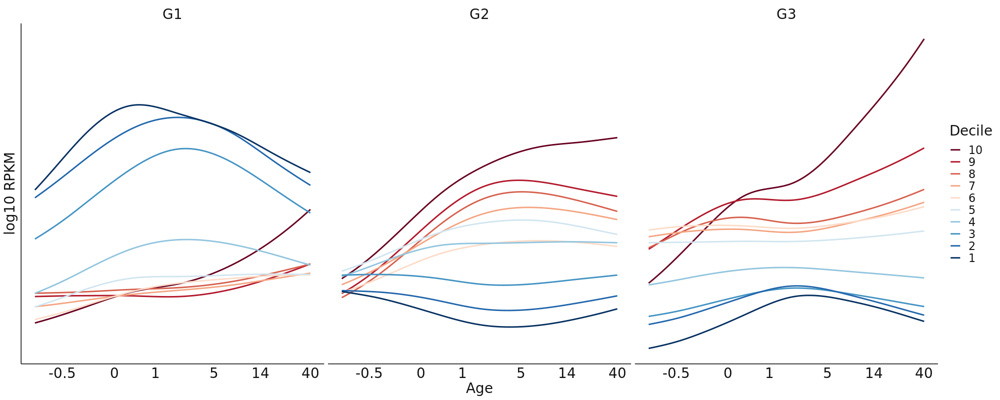

In [368]:
%%R -i quantile_curves -w 20 -h 8 -u in -r 100
source("../code/brainspanPlots.R")
g_curves <- quantile_curves %>% 
rename(label=G_quantile) %>% 
plot_quantile_curves(facet='~G') + scale_color_manual(values=brewer.rdbu(10),name='Decile',labels=seq(10,1))
g_curves

### Fig

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


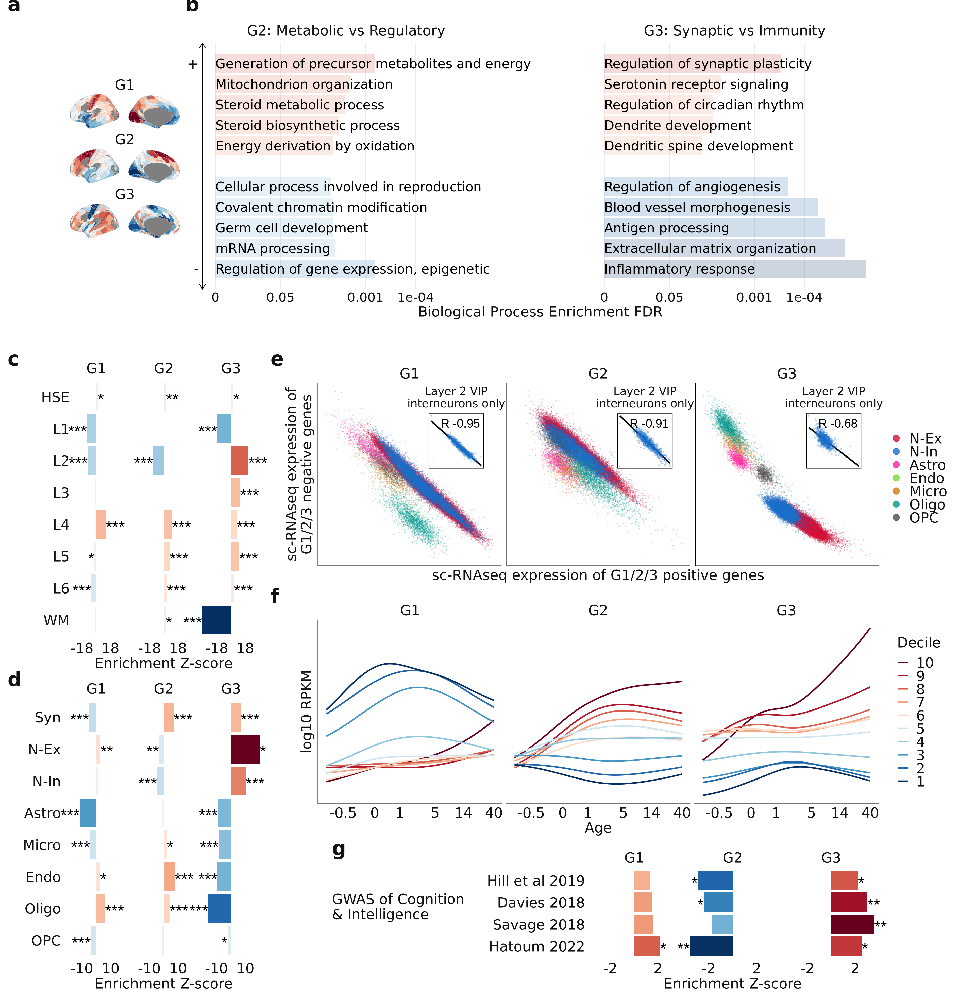

In [437]:
%%R -w 48 -h 50 --units cm -r 200 -i go_enrichments -i scores -i layer_stats -i cell_stats -i gwas_stats
source("../code/Rplots.R")
source("../code/brainPlots.R")
source("../code/enrichmentsPlots.R")
source("../code/brainspanPlots.R")

g_maps <- plot_hcp(scores, facet='w') + guides(fill='none') + theme(plot.tag.position=c(0,.95))

g_enrichments <- plot_go_enrichments(go_enrichments, size=6.5, name='Biological Process Enrichment FDR') + 
        theme(axis.text.y = element_text(size=20, color='grey7', family='Calibri')) +
        theme(plot.tag.position=c(0,.95), plot.margin=margin(b=50))

g_layers <- plot_enrichment_bars_z(layer_stats, xlab='Enrichment Z-score') + 
        theme(axis.text.y = element_text(margin=margin(r=-10, 'pt'), size=20, color='grey7', family='Calibri'),
              axis.text.x = element_text(size=20, color='grey7', family='Calibri'),
              plot.tag.position=c(0,1)
              )
g_cells <- plot_enrichment_bars_z(cell_stats, xlab='Enrichment Z-score') + 
        theme(axis.text = element_text(size=20, color='grey7', family='Calibri'),
              plot.tag.position=c(0,1))

g_gwas <- gwas_stats %>% 
        plot_enrichment_bars_z(xlab='Enrichment Z-score', facet='.~ G') +
        ggtitle('GWAS of Cognition\n& Intelligence') +
        theme(
                axis.text.y = element_text(size=20, color='grey7', family='Calibri', margin=margin(t=0,r=0,b=0,l=7,'cm')),
                plot.title = element_text(size=20, color='grey7', family='Calibri', margin=margin(t=0,r=0,b=-6,l=3,'cm')),
                plot.title.position = "plot",
                plot.tag.position=c(0,1)
        )
        # theme(plot.tag.position=c(0.04,1))

g_singlecell_curves <- (g_singlecell / g_curves) & theme(aspect.ratio=1)

layout <- c(
    area(t=1,b=16,l=1,r=12),
    area(t=1,b=16,l=13,r=48),
    area(t=17,b=50,l=1,r=18),
    area(t=17,b=44,l=19,r=48),
    area(t=45,b=50,l=20,r=48)

)
    
# plot <- g_maps + g_enrichments + g_gwas + plot_layout(design=layout)
plot <- g_maps + g_enrichments + (g_layers / g_cells) + g_singlecell_curves + g_gwas + plot_layout(design=layout)

themed <- plot & theme(
    text=element_text(size=20, color='grey7', family='Calibri'), 
    strip.text=element_text(size=20, color='grey7', family='Calibri'),
    legend.text=element_text(size=20, color='grey7', family='Calibri'),
    plot.tag.position = c(0, 1),
    plot.tag = element_text(size=28, face='bold', family='Calibri', hjust=0)
)

annotated <- themed + plot_annotation(tag_level='a')
annotated

/opt/conda/lib/python3.10/site-packages/rpy2/robjects/pandas2ri.py:56: UserWarning: DataFrame contains duplicated elements in the index, which will lead to loss of the row names in the resulting data.frame
  warnings.warn('DataFrame contains duplicated elements in the index, '



`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


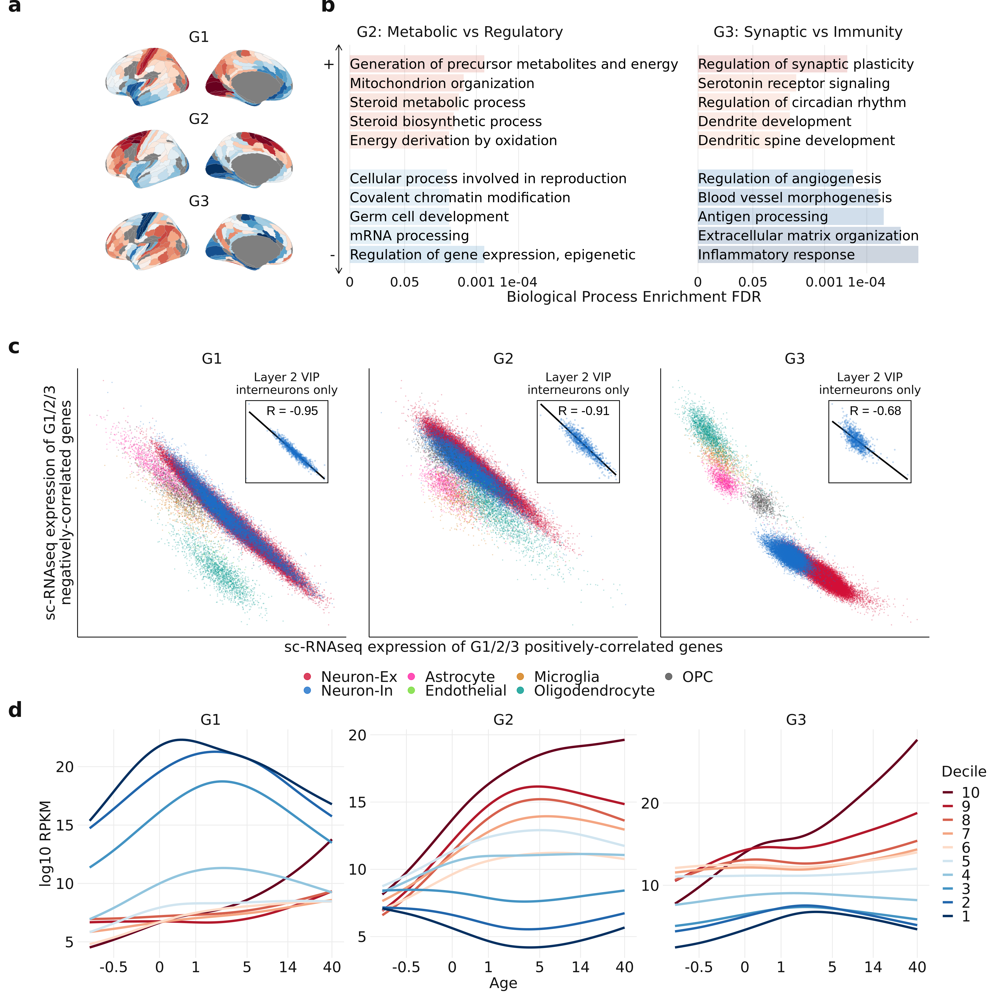

In [ ]:
%%R -w 48 -h 48 --units cm -r 200 -i go_enrichments -i scores
source("../code/Rplots.R")
source("../code/brainPlots.R")
source("../code/enrichmentsPlots.R")
source("../code/brainspanPlots.R")

g_maps <- plot_hcp(scores, facet='w') + guides(fill='none') + theme(plot.tag.position=c(0,.95))

g_enrichments <- plot_go_enrichments(go_enrichments, size=6.5, name='Biological Process Enrichment FDR') + 
        theme(axis.text.y = element_text(size=20, color='grey7', family='Calibri')) +
        theme(plot.tag.position=c(0,.95), plot.margin=margin(b=50))

layout <- c(
    area(t=1,b=15,l=1,r=14),
    area(t=1,b=15,l=15,r=48),
    area(t=16,b=33,l=1,r=48),
    area(t=34,b=48,l=1,r=48)
)
    
plot <- g_maps + g_enrichments + g_singlecell + g_curves + plot_layout(design=layout)

themed <- plot & theme(
    text=element_text(size=20, color='grey7', family='Calibri'), 
    strip.text=element_text(size=20, color='grey7', family='Calibri'),
    legend.text=element_text(size=20, color='grey7', family='Calibri'),
    plot.tag.position = c(0, 1),
    plot.tag = element_text(size=28, face='bold', family='Calibri', hjust=0)
)


annotated <- themed + plot_annotation(
  tag_level='a',
  theme = theme(plot.caption = element_textbox_simple(size = 20, padding = unit(c(40, 5, 5, 5), "pt")))
)
annotated

---

# Fig 4

### Brainchart disorder maps

In [66]:
brainchart_maps = get_disorder_maps().loc[:,['ASD','MDD','SCZ']].apply(lambda x: (x-np.mean(x))/np.std(x))
# brainchart_maps_plot = brainchart_maps.apply(lambda x: (x-np.mean(x))/np.std(x))

In [67]:
brainchart_maps.describe()

,ASD,MDD,SCZ
count,3.400000e+01,3.400000e+01,3.400000e+01
mean,9.632817e-17,6.040919e-16,-3.526591e-16
std,1.015038e+00,1.015038e+00,1.015038e+00
min,-1.870202e+00,-2.149466e+00,-1.750921e+00
25%,-5.281816e-01,-5.462080e-01,-6.285224e-01
50%,-7.161784e-02,-1.178866e-02,-7.174201e-02
75%,5.924749e-01,3.890258e-01,6.971452e-01
max,2.391059e+00,2.660308e+00,2.455864e+00


In [68]:
dk_scores = dme_3d_ds5.score_in_dk()
# dk_scores = dm_ds8.score_in_dk()

In [191]:
brainchart_maps_and_scores = pd.concat([brainchart_maps,dk_scores.set_index('label')], axis=1)

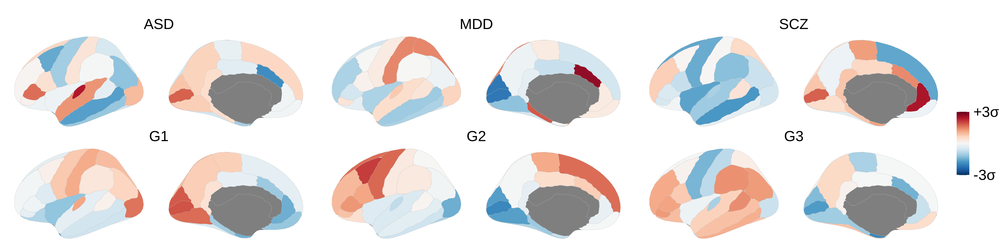

In [192]:
%%R -w 48 -h 12 -u cm -r 200 -i brainchart_maps_and_scores
source("../code/plot_maps.R")
plot_brainchart <- plot_maps_dk(brainchart_maps_and_scores, ncol=3) & 
    theme(
        legend.position='right',
        legend.direction='vertical',
        legend.text = element_text(size=20)
    )
plot_brainchart

### Brainchart disorder heatmap

In [284]:
# dk_null_grads = np.load(f"../outputs/permutations/hcp_3d_ds5_spin_5000_in_dk.npy")
dk_null_grads = np.load(f"../outputs/permutations/spin_dk_5000_dm_hcp_3d_ds5_vertices.npy")
# dk_null_grads = np.load(f"../outputs/permutations/hcp_3d_ds5_spin_5000_v2_in_dk.npy")

In [285]:
corrs = get_corrs(dk_scores, brainchart_maps, method='pearson')
brainchart_null_p = corr_nulls_from_grads(dk_null_grads, dk_scores, brainchart_maps, method='pearsonr', reindex=False)
brainchart_null_p

,G,map,r,p,q
0,G1,ASD,0.473481,0.000200,0.001800
1,G1,MDD,-0.283788,0.137772,0.309988
2,G1,SCZ,0.003597,0.991202,0.991202
3,G2,ASD,-0.274459,0.000800,0.003599
4,G2,MDD,0.214387,0.244151,0.439472
5,G2,SCZ,-0.242288,0.575285,0.739652
6,G3,ASD,-0.081881,0.743451,0.836383
7,G3,MDD,-0.129669,0.540092,0.739652
8,G3,SCZ,-0.435342,0.007798,0.023395


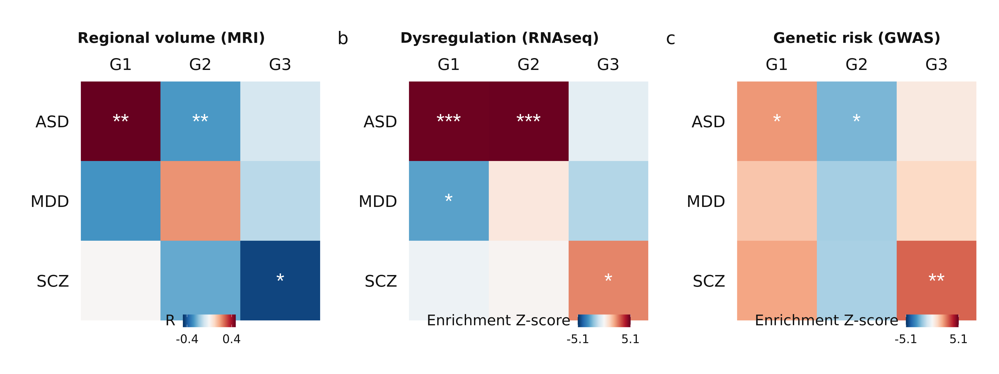

In [195]:
%%R -w 48 -h 18 -u cm -r 200 -i brainchart_null_p

g1 <- plot_map_corrs(brainchart_null_p, size=10) + ggtitle('Regional volume (MRI)') + 
    theme(plot.tag.position = c(-.2, .95), plot.title=element_text(hjust=0.5))
g2 <- plot_heatmap_simple(deg_stats, size=10, limits=5.1) + ggtitle('Dysregulation (RNAseq)') +
    theme(plot.tag.position = c(0, .95), plot.title=element_text(hjust=0.5))
g3 <- plot_heatmap_simple(gwas_stats, size=10, limits=5.1) + ggtitle('Genetic risk (GWAS)') +
    theme(plot.tag.position = c(0, .95), plot.title=element_text(hjust=0.7))

plot_heatmaps <- (g1 + g2 + g3) & theme(
    plot.margin = margin(t=10, r=10, b=10, l=10, "pt"),
    legend.position='bottom',
    text = element_text(size=20, color='grey7', family='Calibri'),
    legend.margin = margin(t=-30, r=10, b=10, l=10, "pt"),
    plot.title.position='plot',
    plot.title = element_text(size=20, color='grey7', face='bold', family='Calibri', vjust=-2.5)
    )

plot_heatmaps + plot_annotation(tag_level='a')

### Brainchart disorder scatters

In [57]:
brainchart_scatter = (brainchart_maps
                .melt(ignore_index=False, var_name='map', value_name='map_score')
                .join(dk_scores.set_index('label')).reset_index()
                .set_index(['label','map','map_score'])
                .melt(ignore_index=False, var_name='G',value_name='G_score')
                .reset_index()
               )

brainchart_scatter_corrs = brainchart_null_p.loc[:,['map','G','r','q']]

In [58]:
%%R -w 20 -h 8 --units in -r 100 -i brainchart_maps -i dk_scores -i brainchart_null_p -i brainchart_scatter -i brainchart_scatter_corrs
source("../code/plot_maps.R")
source("../code/brainPlots.R")

g1a <- plot_maps_dk(brainchart_maps, ncol=1)
g1b <- plot_dk(dk_scores, facet='w')

g2a <- plot_maps_scatter(brainchart_scatter %>% filter(map=='ASD', G=='G1'), brainchart_scatter_corrs %>% filter(map=='ASD', G=='G1'), x=.5, y=-1.5, facet=F)
g2b <- plot_maps_scatter(brainchart_scatter %>% filter(map=='ASD', G=='G2'), brainchart_scatter_corrs %>% filter(map=='ASD', G=='G2'), x=.5, y=-1.5, facet=F) #+ plot_layout(tag_level='new')
g2c <- plot_maps_scatter(brainchart_scatter %>% filter(map=='SCZ', G=='G3'), brainchart_scatter_corrs %>% filter(map=='SCZ', G=='G3'), x=.5, y=-1.5, facet=F) #+ plot_layout(tag_level='new')
g3 <- plot_map_corrs(brainchart_null_p, size=6.5) #+ plot_layout(tag_level='new')

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


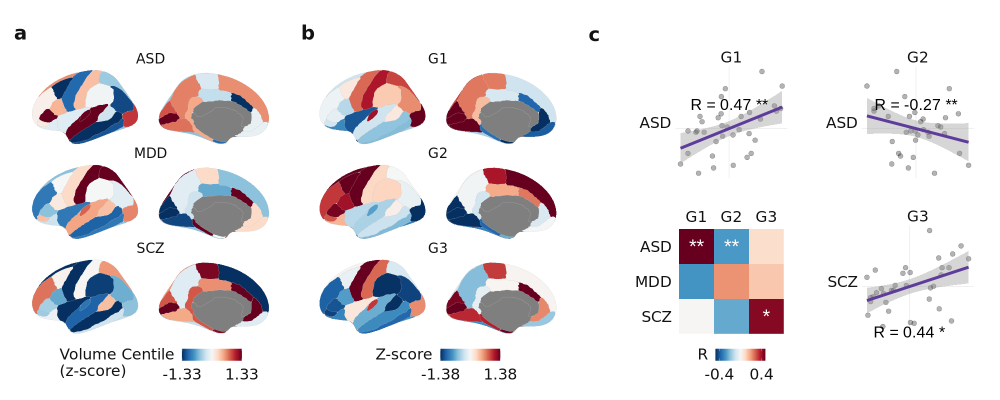

In [59]:
%%R -w 20 -h 8 --units in -r 100 -i brainchart_maps -i dk_scores -i brainchart_null_p -i brainchart_scatter -i brainchart_scatter_corrs
source("../code/plot_maps.R")
source("../code/brainPlots.R")

g1a <- plot_maps_dk(brainchart_maps, ncol=1, name='Volume Centile\n(z-score)') + theme(plot.tag.position=c(0,.95))
g1b <- plot_maps_dk(dk_scores %>% remove_rownames() %>% column_to_rownames('label'), ncol=1) + theme(plot.tag.position=c(0,.95))

g2a <- plot_maps_scatter(brainchart_scatter %>% filter(map=='ASD', G=='G1'), brainchart_scatter_corrs %>% filter(map=='ASD', G=='G1'), 
                         x=0, y=1, facet=F, xlab='G1', ylab='ASD') + theme(plot.tag.position=c(0,.88))
g2b <- plot_maps_scatter(brainchart_scatter %>% filter(map=='ASD', G=='G2'), brainchart_scatter_corrs %>% filter(map=='ASD', G=='G2'), 
                         x=0, y=1, facet=F, xlab='G2', ylab='ASD') + plot_layout(tag_level='new')
g2c <- plot_maps_scatter(brainchart_scatter %>% filter(map=='SCZ', G=='G3'), brainchart_scatter_corrs %>% filter(map=='SCZ', G=='G3'), 
                         x=0, y=-2, facet=F, xlab='G3', ylab='SCZ') + plot_layout(tag_level='new')
g3 <- plot_map_corrs(brainchart_null_p, size=10) + plot_layout(tag_level='new')

g4 <- plot_spacer()

layout <- c(
    area(t=1,b=48,l=1,r=16),
    area(t=1,b=48,l=17,r=32),    
    
    area(t=1,b=24,l=33,r=40),
    area(t=1,b=24,l=41,r=48),
    area(t=25,b=48,l=41,r=48),
    
    area(t=25,b=48,l=33,r=40)
)

plot <- g1a + g1b + g2a + g2b + g2c + g3 + plot_layout(design=layout)

themed <- plot & theme(
    text=element_text(size=22, color='grey7', family='Calibri'), 
    strip.text=element_text(size=22, color='grey7', family='Calibri'),
    legend.text=element_text(size=22, color='grey7', family='Calibri'),
    plot.margin = margin(t=10, r=10, b=10, l=10, "pt"),
    # plot.tag.position = c(0, 1),
    plot.tag = element_text(size=28, face='bold', family='Calibri', hjust=0)
)
# themed

plot_brainchart <- themed + plot_annotation(tag_level='a')
plot_brainchart

In [21]:
brainchart_null_p

,G,map,r,p,q
0,G1,ASD,0.473487,0.000200,0.001800
1,G1,MDD,-0.283792,0.137772,0.309988
2,G1,SCZ,0.003604,0.991202,0.991202
3,G2,ASD,-0.274484,0.000800,0.003599
4,G2,MDD,0.214393,0.244151,0.439472
5,G2,SCZ,-0.242311,0.575085,0.739395
6,G3,ASD,0.081871,0.743451,0.836383
7,G3,MDD,0.129680,0.540092,0.739395
8,G3,SCZ,0.435320,0.007798,0.023395


### SCZ supragranular

In [71]:
hcp_scores = dme_3d_ds5.clean_scores()

In [72]:
import nibabel as nib
from neuromaps.nulls.spins import parcels_to_vertices, vertices_to_parcels
scz_diff_img = nib.load('../data/lh.GyralSulcalDifferences.mgh')
hcp_img = annot_to_gifti('../data/parcellations/lh.HCPMMP1.annot')
scz_diff_hcp = vertices_to_parcels(scz_diff_img.get_fdata(), hcp_img)

In [111]:
scz_diff = (get_labels_hcp()[:180].to_frame()
            .assign(SCZ_supragranular = scz_diff_hcp).set_index('label')
            .apply(lambda x: (x-np.mean(x))/np.std(x))
            .apply(lambda x: -x) # invert to focus on thinning
)

scz_diff_plot = pd.concat([
    scz_diff.set_axis(['SCZ L2-Specific Thinning'], axis=1), 
    hcp_scores.set_index('label')['G3']], axis=1)

scz_diff_scatter = scz_diff \
    .join(hcp_scores.set_index('label')).reset_index() \
    .melt(id_vars=['label','SCZ_supragranular'], var_name='G', value_name='G_score') \
    .rename({'SCZ_supragranular':'map_score'}, axis=1).assign(map='SCZ_supragranular')

In [116]:
nulls = np.load('../outputs/permutations/hcp_3d_ds5_spin_5000_v2.npy')
null_corrs = corr_nulls_from_grads(nulls, hcp_scores, scz_diff)
scz_diff_corrs = null_corrs.reset_index().rename({'level_0':'G', 'level_1':'map'}, axis=1)

In [117]:
scz_diff_corrs

,index,G,map,r,p,q
0,0,G1,SCZ_supragranular,0.130694,0.760848,0.760848
1,1,G2,SCZ_supragranular,-0.148443,0.756649,0.760848
2,2,G3,SCZ_supragranular,0.552247,0.002599,0.007798


`geom_smooth()` using formula = 'y ~ x'


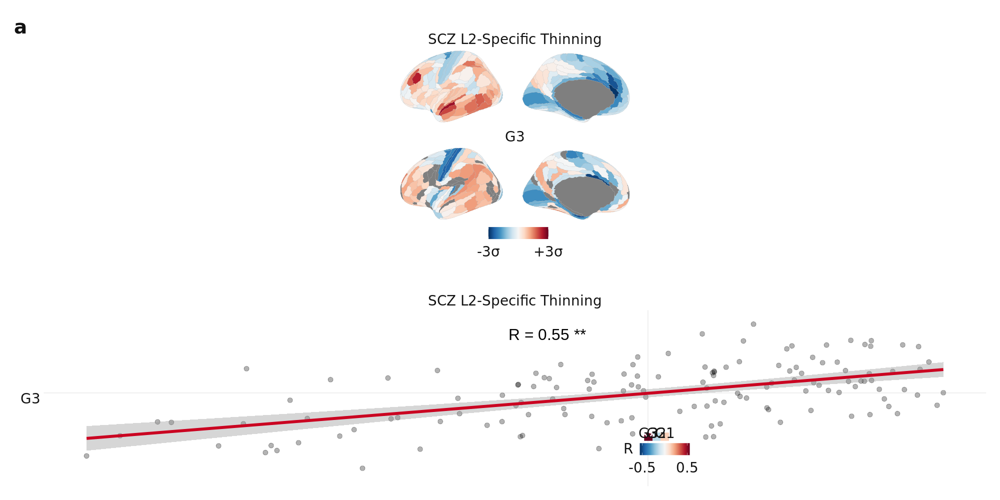

In [209]:
%%R -w 20 -h 10 --units in -r 100 -i scz_diff_plot -i hcp_scores -i scz_diff_scatter -i scz_diff_corrs
source("../code/Rplots.R")
source("../code/plot_maps.R")

g2 = plot_maps(scz_diff_plot, facet='w', ncol=1) + theme(plot.tag.position=c(0,.95))
# g2b = plot_hcp(hcp_scores %>% select(label,G3), name='G3 z-score') + 
#     theme(strip.text.y.left=element_blank(), plot.tag.position=c(0,.9)) + plot_layout(tag_level='new')
g2c = plot_maps_scatter(scz_diff_scatter %>% filter(G=='G3') %>% mutate(map='SCZ L2-Specific Thinning'), 
                        scz_diff_corrs %>% filter(G=='G3') %>% mutate(map='SCZ L2-Specific Thinning'), 
                        facet='h', switch='y', y=2, x=-.5, aspect=NULL, pointsize=3, size=8) + 
    theme(strip.text.y.left=element_text(size=20, color='grey7', family='Calibri'),
          strip.text.x=element_text(size=20, color='grey7', family='Calibri'),
          plot.tag.position=c(0,.95)
        ) + plot_layout(tag_level='new')
g2d = plot_map_corrs(scz_diff_corrs, size=10) + theme(axis.text.y=element_blank()) + plot_layout(tag_level='new')      

layout <- c(
    area(t=1,b=12,l=1,r=24),
    # area(t=8,b=14,l=1,r=24),
    area(t=13,b=24,l=1,r=24)
    # area(t=1,b=12,l=1,r=24),
    # area(t=13,b=24,l=1,r=24),
    # area(t=1,b=24,l=25, r=48)
)

# plot <- g2 + g2c + plot_layout(design=layout)
plot <- g2 + g2c + inset_element(g2d, t=0.4, b=0.03, l=.3, r=1, align_to='full') + plot_layout(design=layout)

themed <- plot & theme(
    text = element_text(size=20, color='grey7', family='Calibri'), 
    legend.text = element_text(size=20, color='grey7', family='Calibri'),
    plot.margin = margin(t=10, r=10, b=10, l=10, "pt"),
    # plot.tag.position = c(0, .95),
    plot.tag = element_text(size=28, face='bold', family='Calibri', hjust=0)
)

plot_scz_supra <- themed + plot_annotation(tag_level='a')
plot_scz_supra

### GWAS & DEGs

In [100]:
gwas_genes = get_gwas_combined() #.loc[lambda x: x['label']!='MDD']
gwas_stats = compute_null_p(*compute_enrichments(weights, null_weights, gwas_genes), adjust_by_label=True)
# gwas_stats

In [101]:
deg_genes = get_deg_consensus()
deg_stats = compute_null_p(*compute_enrichments(weights, null_weights, deg_genes))
deg_stats

,label,G,pct,true_mean,null_mean,null_std,z,pos,p,q,sig,n_genes,n_matches
0,ASD,G1,1.0000,0.064988,-0.032396,0.019430,5.012136,True,0.0000,0.000000,True,1456,824
1,ASD,G2,1.0000,0.078049,0.026068,0.010321,5.036569,True,0.0000,0.000000,True,1456,824
2,ASD,G3,0.3124,0.001846,0.006088,0.008723,-0.486305,False,0.6248,0.803314,False,1456,824
3,MDD,G1,0.0026,-0.199102,-0.031183,0.060735,-2.764793,False,0.0052,0.015600,True,182,92
4,MDD,G2,0.7144,0.044629,0.026584,0.032466,0.555793,True,0.5712,0.803314,False,182,92
5,MDD,G3,0.0650,-0.034214,0.006260,0.026955,-1.501524,False,0.1300,0.234000,False,182,92
6,SCZ,G1,0.4071,-0.040513,-0.032831,0.031328,-0.245224,False,0.8142,0.908200,False,506,336
7,SCZ,G2,0.5459,0.028091,0.026126,0.016837,0.116721,True,0.9082,0.908200,False,506,336
8,SCZ,G3,0.9944,0.041082,0.005940,0.013997,2.510748,True,0.0112,0.025200,True,506,336


### Venn

In [80]:
overlap_deg_gwas = pd.concat({
    'GWAS':gwas_genes,
    'DEG':deg_genes.drop('study',axis=1)
}).reset_index(0).rename({'label':'disorder','level_0':'label'}, axis=1).reset_index(drop=True)

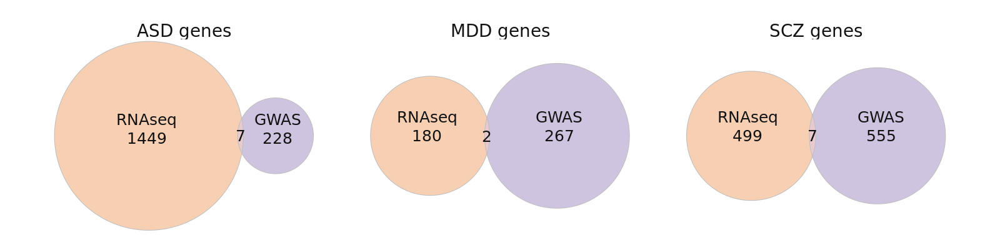

In [136]:
%%R -i overlap_deg_gwas -w 16 -h 4 -u in -r 100
source("../code/enrichmentsPlots.R")
overlaps <- plot_venn(overlap_deg_gwas, disorder='ASD') + 
            (plot_venn(overlap_deg_gwas, disorder='MDD') + plot_layout(tag_level='new')) +
            (plot_venn(overlap_deg_gwas, disorder='SCZ') + plot_layout(tag_level='new'))

plot_overlaps <- overlaps & theme(
                    plot.margin = margin(t=10, r=30, b=10, l=30, "pt"),
                    ) & coord_cartesian(clip='off')
plot_overlaps

### SCZ quantiles

In [135]:
scz_genes = overlap_deg_gwas.loc[lambda x: x['disorder']=='SCZ']
curves = get_brainspan_curves_by_gene(scz_genes['gene'])

KeyboardInterrupt: 

In [103]:
quantiles = make_label_quantiles_by_axis(weights, scz_genes, q=5)

quantile_curves_disorders = (quantiles
 .join(curves.set_index('gene'), on='gene').dropna()
 .groupby(['label','G','G_quantile','age_log10'])
 .agg({'pred':'mean'})
 .reset_index()
 .loc[lambda x: x['G']=='G3']
 .replace({'label':{'DEG':'SCZ RNAseq', 'GWAS':'SCZ GWAS'}})
)
# quantile_curves_disorders

In [104]:
quantiles = make_label_quantiles_by_axis(weights, scz_genes, q=5)

quantile_layers = (quantiles
 .join(get_layer_genes().set_index('gene')['label'].rename('layer'), on='gene')
 .fillna({'layer':'no_layer'})
 .groupby(['label','G','G_quantile','layer']).count()
 .assign(pct = lambda x: x['gene']/x.groupby(['label','G','G_quantile'])['gene'].sum())
 .reset_index()
 .loc[lambda x: x['G']=='G3']
 .loc[lambda x: x['layer']!='no_layer']
 .replace({'label':{'DEG':'SCZ RNAseq', 'GWAS':'SCZ GWAS'}})
)
quantile_layers

,label,G,G_quantile,layer,gene,G_score,pct
80,SCZ RNAseq,G3,1,L1,4,4,0.057143
81,SCZ RNAseq,G3,1,L2,4,4,0.057143
82,SCZ RNAseq,G3,1,L3,0,0,0.000000
83,SCZ RNAseq,G3,1,L4,0,0,0.000000
84,SCZ RNAseq,G3,1,L5,3,3,0.042857
...,...,...,...,...,...,...,...
234,SCZ GWAS,G3,5,L3,2,2,0.045455
235,SCZ GWAS,G3,5,L4,2,2,0.045455
236,SCZ GWAS,G3,5,L5,1,1,0.022727
237,SCZ GWAS,G3,5,L6,4,4,0.090909


Scale for alpha is already present.
Adding another scale for alpha, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


/opt/conda/lib/python3.10/site-packages/rpy2/robjects/pandas2ri.py:65: UserWarning: Error while trying to convert the column "G_quantile". Fall back to string conversion. The error is: Converting pandas "Category" series to R factor is only possible when categories are strings.
  warnings.warn('Error while trying to convert '


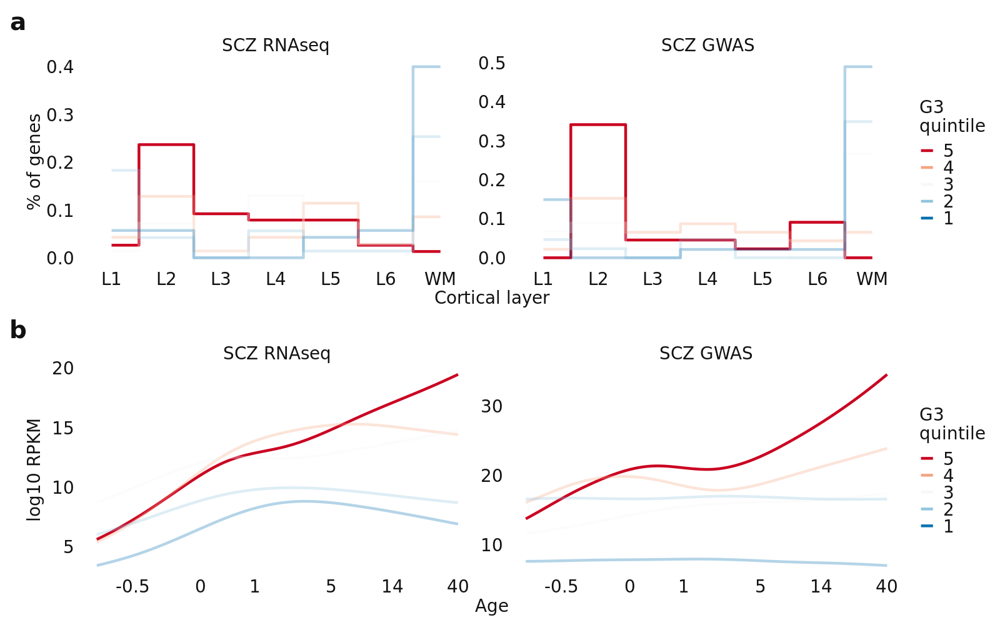

In [211]:
%%R -i quantile_curves_disorders -i quantile_layers -w 16 -h 10 -u in -r 100
source("../code/brainspanPlots.R")
source("../code/enrichmentsPlots.R")

plot_curves <- quantile_curves_disorders %>% 
    rename(label=G_quantile, data=label) %>% 
    mutate(data=factor(data, ordered=T, levels=unique(.$data))) %>% 
    plot_quantile_curves(facet='~data')

plot_layers <- quantile_layers %>% 
    rename(label=G_quantile, data=label) %>% 
    mutate(data=factor(data, ordered=T, levels=unique(.$data))) %>% 
    mutate(layer=factor(layer, ordered=T, levels=unique(.$layer))) %>%
    plot_quantile_steps(facet='~data') #+ 
    # theme(axis.text.x=element_text(margin=margin(b=-30, unit='pt')))

plot <- (plot_layers / plot_curves) & 
    scale_alpha_manual(values=c(1,rep(0.3,4))) &
    scale_color_manual(
        values=brewer.rdbu(5),
        labels=rev(c('1', '2', '3', '4', '5')), name='G3\nquintile')
    # scale_color_manual(
    #     values=c(viridis(5)) %>% rev,
    #     labels=rev(c('80-100%', '60-80%', '40-60%','20-40%','0-20%')), name='G3 quintile')

themed <- plot & theme(
    panel.grid = element_blank(),
    text = element_text(size=20, color='grey7', family='Calibri'), 
    strip.text.x = element_text(size=20, color='grey7', family='Calibri'), 
    legend.text = element_text(size=20, color='grey7', family='Calibri'),
    # plot.margin = margin(t=10, r=10, b=10, l=10, "pt"),
    # plot.tag.position = c(0, .95),
    plot.tag = element_text(size=28, face='bold', family='Calibri', hjust=0)
)

plot_scz_quantiles <- themed + plot_annotation(tag_level='a')
plot_scz_quantiles

### Fig

`geom_smooth()` using formula = 'y ~ x'


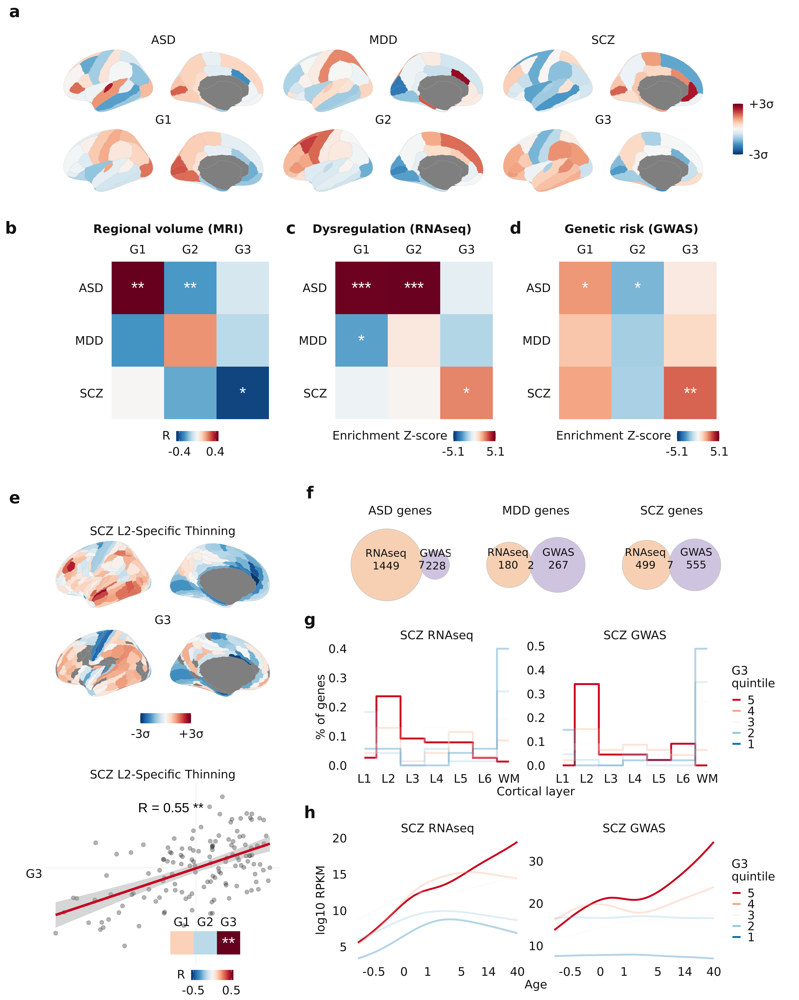

In [212]:
%%R -w 48 -h 60 -u cm -r 200 -i brainchart_null_p
source("../code/plot_maps.R")
source("../code/enrichmentsPlots.R")

g1 <- plot_map_corrs(brainchart_null_p, size=10) + ggtitle('Regional volume (MRI)') + 
    theme(plot.tag.position = c(-.27, .95), plot.title=element_text(hjust=0.5))
g2 <- plot_heatmap_simple(deg_stats, size=10, limits=5.1) + ggtitle('Dysregulation (RNAseq)') +
    theme(plot.tag.position = c(0, .95), plot.title=element_text(hjust=0.5))
g3 <- plot_heatmap_simple(gwas_stats, size=10, limits=5.1) + ggtitle('Genetic risk (GWAS)') +
    theme(plot.tag.position = c(0, .95), plot.title=element_text(hjust=0.7))

plot_heatmaps <- (g1 + g2 + g3) & theme(
    plot.margin = margin(t=10, r=10, b=10, l=10, "pt"),
    legend.position='bottom',
    text = element_text(size=20, color='grey7', family='Calibri'),
    legend.margin = margin(t=0, r=0, b=0, l=0, "cm"),
    plot.title.position='plot',
    plot.title = element_text(size=20, color='grey7', face='bold', family='Calibri', vjust=-2.5)
    )

layout <- c(
    area(t=1,b=12,l=1,r=48),
    area(t=13,b=28,l=2,r=48),
    # area(t=13, b=28,l=2,r=16),
    # area(t=13, b=28,l=17,r=31),
    # area(t=13, b=28,l=34,r=48),
    area(t=29,b=60,l=1,r=16),
    area(t=29,b=34,l=17,r=48),
    area(t=35,b=60,l=17,r=48)
)

# plot <- plot_brainchart + plot_heatmaps + plot_layout(design=layout)
# plot <- plot_heatmaps + plot_layout(design=layout)
plot <- plot_brainchart + plot_heatmaps + plot_scz_supra + plot_overlaps + plot_scz_quantiles + plot_layout(design=layout)

themed <- plot & theme(
    text=element_text(size=20, color='grey7', family='Calibri'), 
    legend.text=element_text(size=20, color='grey7', family='Calibri'),
    # plot.margin = margin(t=30, r=30, b=30, l=30, "pt"),
    # plot.tag.position = c(0, .95),
    plot.tag = element_text(size=28, face='bold', family='Calibri', hjust=0)
)

plot <- themed + plot_annotation(tag_level='a')
plot

---

# Supplement

### Donor distribution

In [47]:
counts_hcp = pd.read_csv("../outputs/counts_hcp.csv", index_col=0)
# stability = pd.read_csv("../outputs/stability_hcp_ranked.csv", index_col=0).set_index('gene_symbol')
donor_counts = (counts_hcp!=0).sum(axis=1)[:180].rename('count').to_frame().join(get_labels_hcp()).set_index('label')

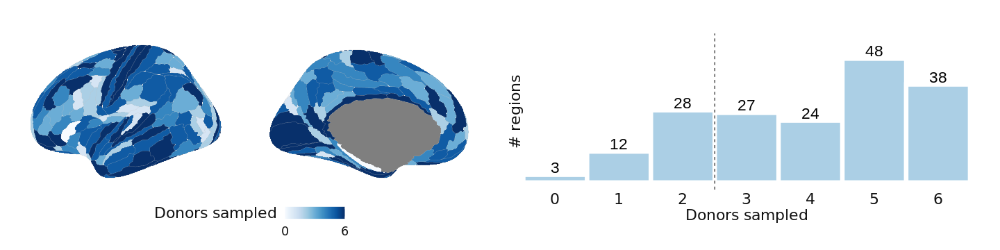

In [1785]:
%%R -i donor_counts -w 20 -h 5  --units in
source("../code/Rplots.R")
g1 = plot_maps(donor_counts, 
    colorscale='absolute', colors=brewer.blues(100), name='Donors sampled') + 
    theme(strip.text.x=element_blank(), legend.margin=margin(-30), legend.title=element_text(vjust=1))
g2 = plot_dist_donors_hcp(donor_counts)

(g1 | g2) & theme(
    text=element_text(size=22, color='grey7', family='Calibri')
    )

### Version scatter plots

In [1515]:
versions_scores = pd.concat({
   'pca_base' : pca_base.clean_scores(),
   'pca_3d_ds7' : pca_3d_ds7.clean_scores(),
   'dme_3d_ds5' : dme_3d_ds5.clean_scores(),
   'dme_ds8' : dme_ds8.clean_scores()
}).reset_index(level=0).rename({'level_0':'version'},axis=1)

scores_melt = (versions_scores
               .set_index(['version', 'label'])
               .melt(ignore_index=False, var_name='G', value_name='score')
               .reset_index('version')
)
df_versions_scatter = (scores_melt.join(scores_melt, lsuffix='_x', rsuffix='_y')
    .loc[lambda x: 
            (x['version_x'].str.contains('pca_3d_ds7')) & (x['version_y'].str.contains('ds5')) |
            (x['version_x'].str.contains('pca_3d_ds7')) & (x['version_y'].str.contains('ds8')) |
            (x['version_x'].str.contains('ds5')) & (x['version_y'].str.contains('ds8'))
    ]
    .assign(version_pair = lambda x: x['version_x']+'__'+x['version_y'])
)
df_versions_scatter.head()

,version_x,G_x,score_x,version_y,G_y,score_y,version_pair
label,,,,,,,
1,pca_3d_ds7,G1,1.511613,dme_3d_ds5,G1,1.458682,pca_3d_ds7__dme_3d_ds5
1,pca_3d_ds7,G1,1.511613,dme_ds8,G1,1.509932,pca_3d_ds7__dme_ds8
1,pca_3d_ds7,G1,1.511613,dme_3d_ds5,G2,0.537937,pca_3d_ds7__dme_3d_ds5
1,pca_3d_ds7,G1,1.511613,dme_ds8,G2,-0.101239,pca_3d_ds7__dme_ds8
1,pca_3d_ds7,G1,1.511613,dme_3d_ds5,G3,0.935684,pca_3d_ds7__dme_3d_ds5


`summarise()` has grouped output by 'G_x'. You can override using the `.groups` argument.
`summarise()` has grouped output by 'G_x'. You can override using the `.groups` argument.
`summarise()` has grouped output by 'G_x'. You can override using the `.groups` argument.


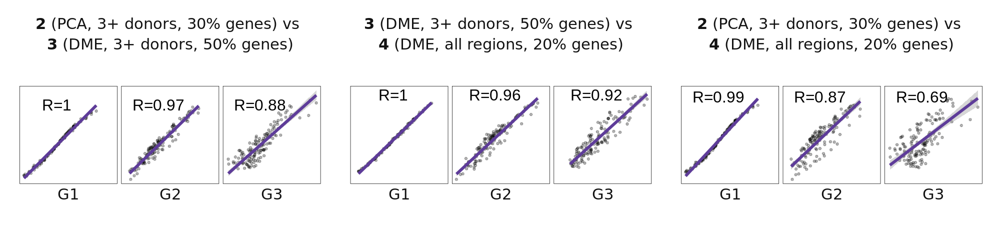

In [1798]:
%%R -w 20 -h 5 --units in -r 100 -i df_versions_scatter

plot_version_pair <- function(df, title, x=0, y=2.5,size=8) {
    r = df %>% group_by(G_x, G_y) %>% summarize(r=cor(score_x, score_y)) %>% 
    mutate(r_label=paste0('R=', round(r,2))) %>% filter(G_x==G_y)

    df %>%
    filter(G_x==G_y) %>%
    ggplot(aes(x=score_x, y=score_y)) + 
    facet_grid(~G_y, switch='x') + 
    geom_point(alpha=.3) +
    geom_smooth(method='lm', color=brewer.puor(5)[5], size=2, se=T) +
    geom_text(data=r, aes(label=r_label, x=x, y=y), size=size, hjust=0.5, vjust=0.5) +
    ggtitle(title) +
    theme_minimal() + 
    theme(panel.grid = element_blank(),
        text = element_text(size=22, color='grey7', family='Calibri'),
        strip.text.x = element_text(size=22, color='grey7', family='Calibri', angle=0),
        strip.text.y = element_blank(),
        # strip.text.y = element_text(size=22, color='grey7', family='Calibri', angle=0),
        axis.text = element_blank(), axis.title = element_blank(),
        panel.border=element_rect(fill='transparent'),
        plot.title=element_text(size=22, color='grey7', family='Calibri', hjust=.5),
        aspect.ratio=1,
        plot.margin=margin(l=20,r=20,b=20,t=20)
)
}

g1 = df_versions_scatter %>% filter(version_pair == 'pca_3d_ds7__dme_3d_ds5') %>% 
    plot_version_pair(title=expression(atop(bold('2') * ' (PCA, 3+ donors, 30% genes) vs ', 
                                             bold('3') * ' (DME, 3+ donors, 50% genes)')))
g2 = df_versions_scatter %>% filter(version_pair == 'dme_3d_ds5__dme_ds8') %>% 
    plot_version_pair(title=expression(atop(bold('3') * ' (DME, 3+ donors, 50% genes) vs ', 
                                             bold('4') * ' (DME, all regions, 20% genes)')))                                             
g3 = df_versions_scatter %>% filter(version_pair == 'pca_3d_ds7__dme_ds8') %>% 
    plot_version_pair(title=expression(atop(bold('2') * ' (PCA, 3+ donors, 30% genes) vs ', 
                                             bold('4') * ' (DME, all regions, 20% genes)')))


g1 + g2+ g3

### Parameter choices

In [1348]:
# Define variations of processing parameters to test
variations = {
    # 'gene_stability_threshold': [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9],
    # 'donors_threshold': [3,2,1],
    # 'lr_mirror': [None],
    # 'ibf_threshold': [0.0, 0.2, 0.5, 0.8],
    # 'tolerance': [0,4],
    # 'sim_threshold': [2],
    # 'agg_metric': ['median'],
    'sample_norm': [None, 'center', 'zscore', 'rs'],
    'gene_norm': [None, 'center', 'zscore', 'rs'],
    # 'probe_selection': ['max_intensity', 'mean', 'rnaseq']
}
defaults = {
    'gene_stability_threshold': 0.5,
    'donors_threshold': 3,
    'lr_mirror': 'rightleft',
    'ibf_threshold': 0.5,
    'tolerance': 2,
    'probe_selection': 'diff_stability',
    'sim_threshold': None,
    'agg_metric': 'mean',
    'sample_norm': 'srs',
    'gene_norm': 'srs'
}

# Reset if desired
# robustness_data = {}
robustness_data = robustness_data_3d_ds5

# Process data with one parameter varied, and save
for parameter, values in variations.items():
    print(f'--- Processing values of {parameter} ---')
    robustness_data[parameter] = {}
    for v in values:
        # Reset kwargs to default values
        kwargs = defaults.copy()
        # Update one value
        kwargs[parameter]=v
        exp = get_expression_abagen(fetch_hcp(), **kwargs)
        robustness_data[parameter][v] = exp
        print(f'Done {parameter}={v}')

# # For each parameter, insert the default data as base
# for parameter, default_value in defaults.items():
#     robustness_data[parameter][default_value] = base

--- Processing values of sample_norm ---
7973 genes remain               after filtering for top 0.5 stability
Done sample_norm=None
7973 genes remain               after filtering for top 0.5 stability
Done sample_norm=center
7973 genes remain               after filtering for top 0.5 stability
Done sample_norm=zscore
7973 genes remain               after filtering for top 0.5 stability
Done sample_norm=rs
--- Processing values of gene_norm ---
7973 genes remain               after filtering for top 0.5 stability
Done gene_norm=None
7973 genes remain               after filtering for top 0.5 stability
Done gene_norm=center
7973 genes remain               after filtering for top 0.5 stability
Done gene_norm=zscore
7973 genes remain               after filtering for top 0.5 stability
Done gene_norm=rs


In [1349]:
# save_pickle(robustness_data, 'robustness_data_base')
# save_pickle(robustness_data, 'robustness_data_3d_ds8')
save_pickle(robustness_data, 'robustness_data_3d_ds5')
# save_pickle(robustness_data, 'robustness_data_ds8')
# robustness_data_base = load_pickle('robustness_data_base')
# robustness_data_3d_ds8 = load_pickle('robustness_data_3d_ds8')
robustness_data_3d_ds5 = load_pickle('robustness_data_3d_ds5')
# robustness_data_ds8 = load_pickle('robustness_data_ds8')

In [1350]:
def get_robustness_corrs(base_model, robustness_data=robustness_data, approach='pca', test_dme_robustness=False):
    robustness_corrs = {}
    for parameter, values in robustness_data.items():
        robustness_corrs[parameter] = {}
        for value, data in values.items():
            name_to_print = f'{parameter}:{value}'
            model = gradientVersion(approach=approach).fit(data, name=name_to_print)
            # corrs = model.corr_scores(base_model, match=True)['corr']
            corrs = pd.Series(np.diag(model.corr_scores(base_model, match=False)))
            robustness_corrs[parameter][value] = np.abs(corrs)
    
    # test base model against variations of DME parameters
    if test_dme_robustness:
        robustness_corrs['alpha'] = {}
        for alpha in [0,0.5]:
            name_to_print = f'alpha:{alpha}'
            data = base_model.expression
            model = gradientVersion(approach=approach, alpha=alpha).fit(data, name=name_to_print)
            corrs = pd.Series(np.diag(model.corr_scores(base_model, match=False)))
            robustness_corrs['alpha'][alpha] = np.abs(corrs)

        robustness_corrs['kernel'] = {}
        for kernel in ['gaussian', 'cosine', 'pearson']:
            name_to_print = f'kernel:{kernel}'
            data = base_model.expression
            model = gradientVersion(approach=approach, kernel=kernel).fit(data, name=name_to_print)
            corrs = pd.Series(np.diag(model.corr_scores(base_model, match=False)))
            robustness_corrs['kernel'][kernel] = np.abs(corrs)
            
    return robustness_corrs

In [1332]:
# get_expression_abagen(atlas=fetch_hcp(), gene_stability_threshold=0.8, save_name='hcp_ds8')
dm_hcp_ds8 = gradientVersion().fit('hcp_ds8')

New gradients version: method=dm, kernel=normalized_angle, sparsity=0, data=hcp_ds8


In [1324]:
pca_hcp_base = gradientVersion(approach='pca').fit(get_expression_abagen(atlas=fetch_hcp()))

New gradients version: method=pca, kernel=None, sparsity=0, data=


In [1351]:
robustness_corrs = {
    # 'pca_hcp_base': get_robustness_corrs(pca_hcp_base, robustness_data_base, approach='pca'),
    'pca_hcp_3d_ds8': get_robustness_corrs(pca_hcp_3d_ds8, robustness_data_3d_ds8, approach='pca'),
    'dm_hcp_3d_ds5': get_robustness_corrs(dm_hcp_3d_ds5, robustness_data_3d_ds5, approach='dm', test_dme_robustness=True),
    'dm_hcp_ds8': get_robustness_corrs(dm_hcp_ds8, robustness_data_ds8, approach='dm', test_dme_robustness=True)
}

New gradients version: method=pca, kernel=None, sparsity=0, data=gene_stability_threshold:0.0
New gradients version: method=pca, kernel=None, sparsity=0, data=gene_stability_threshold:0.1
New gradients version: method=pca, kernel=None, sparsity=0, data=gene_stability_threshold:0.2
New gradients version: method=pca, kernel=None, sparsity=0, data=gene_stability_threshold:0.3
New gradients version: method=pca, kernel=None, sparsity=0, data=gene_stability_threshold:0.4
New gradients version: method=pca, kernel=None, sparsity=0, data=gene_stability_threshold:0.5
New gradients version: method=pca, kernel=None, sparsity=0, data=gene_stability_threshold:0.6
New gradients version: method=pca, kernel=None, sparsity=0, data=gene_stability_threshold:0.7
New gradients version: method=pca, kernel=None, sparsity=0, data=gene_stability_threshold:0.8
New gradients version: method=pca, kernel=None, sparsity=0, data=gene_stability_threshold:0.9
New gradients version: method=pca, kernel=None, sparsity=0, 

In [1352]:
robustness = {}
for version_name, version_corrs in robustness_corrs.items():
    version_dict = {param:pd.concat(value_corrs) for param, value_corrs in version_corrs.items()}
    robustness[version_name] = pd.concat(version_dict)
robustness = (pd.concat(robustness)
  .reset_index()
  .set_axis(['version','parameter', 'value', 'G', 'corr'], axis=1)
  .assign(value = lambda x: x['value'].astype('str'))
)
robustness

,version,parameter,value,G,corr
0,pca_hcp_3d_ds8,gene_stability_threshold,0.0,0,0.995165
1,pca_hcp_3d_ds8,gene_stability_threshold,0.0,1,0.847612
2,pca_hcp_3d_ds8,gene_stability_threshold,0.0,2,0.197083
3,pca_hcp_3d_ds8,gene_stability_threshold,0.0,3,0.082761
4,pca_hcp_3d_ds8,gene_stability_threshold,0.0,4,0.182883
...,...,...,...,...,...
540,dm_hcp_ds8,kernel,pearson,0,0.941311
541,dm_hcp_ds8,kernel,pearson,1,0.877053
542,dm_hcp_ds8,kernel,pearson,2,0.795657
543,dm_hcp_ds8,kernel,pearson,3,0.679419


In [1959]:
# Remove identity rows
# drops = [
#   ('pca_hcp_3d_ds8','gene_stability_threshold',0.8),
#   ('dm_hcp_3d_ds5','gene_stability_threshold',0.5),
#   ('dm_hcp_ds8','gene_stability_threshold',0.8),
#   ('pca_hcp_3d_ds8','donors_threshold',3),
#   ('dm_hcp_3d_ds5','donors_threshold',3),
#   ('dm_hcp_ds8','donors_threshold',1)
# ]

robustness = {}
for version_name, version_corrs in robustness_corrs.items():
    version_dict = {param:pd.concat(value_corrs) for param, value_corrs in version_corrs.items()}
    robustness[version_name] = pd.concat(version_dict)
robustness = (pd.concat(robustness)
  # .drop(index=drops)
  .reset_index()
  .set_axis(['version','parameter', 'value', 'G', 'corr'], axis=1)
  .assign(value = lambda x: x['value'].astype('str'))
)
# robustness



# Replace names of some value parameters for plot
robustness['value'] = robustness['value'].replace({'nan':'none',})
robustness.loc[lambda x: x['parameter']=='gene_stability_threshold', 'value'] = \
  robustness.loc[lambda x: x['parameter']=='gene_stability_threshold', 'value'] \
  .apply(lambda ds: f'top {100-round(float(ds)*100)}%').replace({'top 100%':'all genes'})

robustness.loc[lambda x: x['parameter']=='donors_threshold', 'value'] = \
  robustness.loc[lambda x: x['parameter']=='donors_threshold', 'value'] \
  .replace({'1':'all regions', '2': '2+ donors', '3': '3+ donors'})

# Replace parameter names for plot
parameter_names = {
    'gene_stability_threshold': 'Differential stability\ngene filter',
    'donors_threshold': 'Donors/region filter',
    'lr_mirror': 'Right hemi samples\nDefault: mirror',
    'ibf_threshold': 'Gene intensity filter\nDefault: 0.5',
    'sim_threshold': 'Probe similarity threshold\nDefault: none',
    'probe_selection': 'Probe-to-gene selection\nDefault: differential stability',
    'tolerance': 'Sample-to-region \nmatching tolerance\nDefault: 2',
    'agg_metric': 'Sample-to-region aggregation\nDefault: mean',
    'sample_norm': 'Sample normalization\nDefault: scaled robust sigmoid',
    'gene_norm': 'Gene normalization\nDefault: scaled robust sigmoid',
    'kernel': 'DME kernel parameter\nDefault: normalized cosine',
    'alpha': 'DME alpha parameter\nDefault: 1',
}
robustness['parameter'] = pd.Categorical(robustness['parameter'].map(parameter_names),
                          categories=parameter_names.values(), ordered=True)

# Replace version names for plot
version_names = {
    'pca_hcp_base': 'PCA, all genes,\nall regions',
    'pca_hcp_3d_ds8': 'PCA, 20% genes,\n3+ donor regions',
    'dm_hcp_3d_ds5': 'DME, 50% genes,\n3+ donor regions',
    'dm_hcp_ds8': 'DME, 20% genes,\nall regions'
}
robustness['version'] = robustness['version'].map(version_names)
robustness['value'] = pd.Categorical(robustness['value'], 
                      categories=robustness['value'].unique(), ordered=True)
robustness = robustness.sort_values(['parameter', 'value'])

# Identify self rows
robustness['self'] = False
robustness.loc[lambda x: (x['version'].str.contains('PCA')) & 
                         (x['parameter'].str.contains('gene filter')) & 
                         (x['value'].str.contains('top 20%')),
               'self'] = True
robustness.loc[lambda x: (x['version'].str.contains('DME, 50%')) & 
                         (x['parameter'].str.contains('gene filter')) & 
                         (x['value'].str.contains('top 50%')),
               'self'] = True
robustness.loc[lambda x: (x['version'].str.contains('DME, 20%')) & 
                         (x['parameter'].str.contains('gene filter')) & 
                         (x['value'].str.contains('top 20%')),
               'self'] = True
robustness.loc[lambda x: (x['version'].str.contains('PCA')) & 
                         (x['parameter'].str.contains('Donors/region')) & 
                         (x['value'].str.contains('3+')),
               'self'] = True
robustness.loc[lambda x: (x['version'].str.contains('DME, 50%')) & 
                         (x['parameter'].str.contains('Donors/region')) & 
                         (x['value'].str.contains('3+')),
               'self'] = True
robustness.loc[lambda x: (x['version'].str.contains('DME, 20%')) & 
                         (x['parameter'].str.contains('Donors/region')) & 
                         (x['value'].str.contains('all regions')),
               'self'] = True

robustness

,version,parameter,value,G,corr,self
0,"PCA, 20% genes,\n3+ donor regions",Differential stability\ngene filter,all genes,0,0.995165,False
1,"PCA, 20% genes,\n3+ donor regions",Differential stability\ngene filter,all genes,1,0.847612,False
2,"PCA, 20% genes,\n3+ donor regions",Differential stability\ngene filter,all genes,2,0.197083,False
3,"PCA, 20% genes,\n3+ donor regions",Differential stability\ngene filter,all genes,3,0.082761,False
4,"PCA, 20% genes,\n3+ donor regions",Differential stability\ngene filter,all genes,4,0.182883,False
...,...,...,...,...,...,...
525,"DME, 20% genes,\nall regions",DME alpha parameter\nDefault: 1,0.5,0,0.999997,False
526,"DME, 20% genes,\nall regions",DME alpha parameter\nDefault: 1,0.5,1,0.999745,False
527,"DME, 20% genes,\nall regions",DME alpha parameter\nDefault: 1,0.5,2,0.999742,False
528,"DME, 20% genes,\nall regions",DME alpha parameter\nDefault: 1,0.5,3,0.999921,False


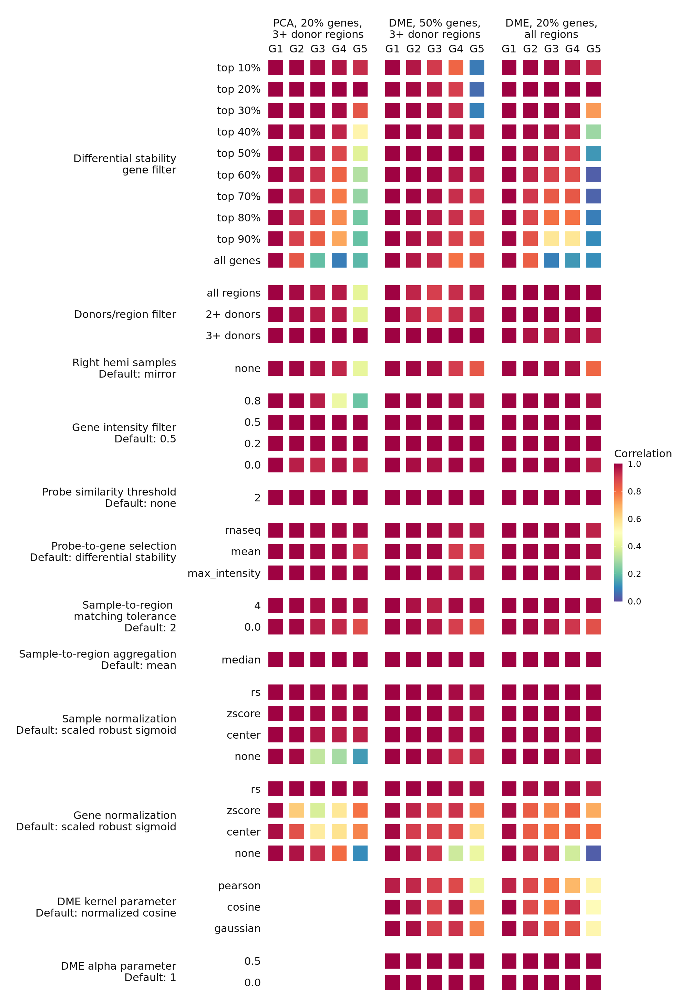

In [1960]:
%%R -w 20 -h 29 -r 100 --units in -i robustness
# robustness %>% filter(grepl('Gene', parameter))
robustness <- robustness %>%
mutate(version = factor(version, ordered=T, levels=unique(.$version))) %>%
mutate(parameter = factor(parameter, ordered=T, levels=unique(.$parameter))) %>%
mutate(value = factor(value, ordered=T, levels=unique(.$value))) %>%
mutate(G = factor(G, levels=c(0,1,2,3,4), labels=c('G1','G2','G3','G4','G5')))

robustness %>% 
ggplot(aes(x=G, y=value, fill=corr)) + 
facet_grid(parameter~version, scales='free_y', space='free', switch='y') + #, scales='free_x', switch='x') + 
geom_tile(aes(alpha=self), width=.7, height=.7) + #, color='grey50', size=.5) +
# geom_text(aes(label='★'), data=robustness %>% filter(corr>0.6), color='gray30', size=5) +
scale_alpha_manual(values=c(1,1), guide='none') +
scale_fill_gradientn(
        colors=rev(brewer.spectral(100)),
      #   colors=cubicl(100),
        limits=c(0,1.001), breaks=seq(0,1,.2),
        labels=c('0.0', '0.2', '0.4', '0.6', '0.8', '1.0'),
        name='Correlation'
) +
coord_cartesian(clip='off') +
scale_x_discrete(position='top') +
# guides(fill=guide_colorbar(barwidth=20)) +
guides(fill=guide_colorbar(barheight=20)) +
ylab('') + xlab('') +
theme_minimal() +
theme(text=element_text(size=22, family='Calibri', color='grey7'),
      axis.text=element_text(size=22, family='Calibri', color='grey7'),
      panel.grid=element_blank(),
      panel.spacing=unit(1,'lines'),
      legend.position='right',
      # legend.title=element_text(vjust=1),
      # axis.text.x=element_text(),
      strip.placement='outside',
      strip.text.x=element_text(size=22, family='Calibri', color='grey7'),
      strip.text.y.left=element_text(size=22, family='Calibri', color='grey7', 
                  angle=0, hjust=1, margin=margin(r=20)),
      plot.margin=margin(l=10,r=30,t=10,b=10)
)

### Raster plot of filtering options

Compute expression data for all triplets, or load from file

In [657]:
# triplets_hcp = get_triplets(atlas=fetch_hcp())
# save_pickle(triplets_hcp, "triplets_hcp")
triplets_hcp = load_pickle('triplets_hcp')
print("Got base triplets")

# triplets_hcp_2donors = get_triplets(atlas=fetch_hcp(), donors_threshold=2)
# save_pickle(triplets_hcp_2donors, "triplets_hcp_2donors")
triplets_hcp_2donors = load_pickle('triplets_hcp_2donors')
print("Got 2donors triplets")

# triplets_hcp_3donors = get_triplets(atlas=fetch_hcp(), donors_threshold=3)
# save_pickle(triplets_hcp_3donors, "triplets_hcp_3donors")
triplets_hcp_3donors = load_pickle('triplets_hcp_3donors')
print("Got 3donors triplets")

Got base triplets
Got 2donors triplets
Got 3donors triplets


Load triplets data from pickles since triplet stability levels are slow to compute

In [ ]:
# triplets_pca = make_triplet_ds_plot(get_triplets_stability_levels(triplets_hcp, approach='pca', kernel=None))
# triplets_dm = make_triplet_ds_plot(get_triplets_stability_levels(triplets_hcp, approach='dm', kernel='normalized_angle', alpha=1))
# triplets_pca_2d = make_triplet_ds_plot(get_triplets_stability_levels(triplets_hcp_2donors, approach='pca', kernel=None))
# triplets_dm_2d = make_triplet_ds_plot(get_triplets_stability_levels(triplets_hcp_2donors, approach='dm', kernel='normalized_angle', alpha=1))
# triplets_pca_3d = make_triplet_ds_plot(get_triplets_stability_levels(triplets_hcp_3donors, approach='pca', kernel=None))
# triplets_dm_3d = make_triplet_ds_plot(get_triplets_stability_levels(triplets_hcp_3donors, approach='dm', kernel='normalized_angle', alpha=1))

In [682]:
test_filter = filter_triplet_stability(triplets_hcp, 0)

In [681]:
test = get_triplets_stability_levels(triplets_hcp, approach='pca', kernel='normalized_angle')

Computed triplet stability


In [693]:
disjoint_corrs(test[0.0], how='scores')

,012-345,013-245,014-235,015-234,023-145,024-135,025-134,034-125,035-124,045-123
0,0.543736,0.581009,0.676152,0.790261,-0.565463,0.544644,0.519850,0.378641,0.600954,0.533978
1,0.658703,0.799073,0.808863,0.659182,0.211683,0.855588,0.644313,-0.664409,0.867053,0.850703
2,-0.107891,-0.015331,0.073367,-0.240276,0.013046,0.160361,0.573299,-0.244535,0.009613,0.024877
3,0.018316,0.668425,0.357197,-0.140525,-0.311441,0.209577,0.029880,-0.046783,0.402641,0.517369
4,0.486126,-0.144195,0.434024,0.508853,0.447273,0.497194,0.148231,-0.478726,-0.278482,0.303896


In [685]:
# triplets_kernelpca = make_triplet_ds_plot(get_triplets_stability_levels(triplets_hcp, approach='pca', kernel='pearson'))
# triplets_kernelpca_2d = make_triplet_ds_plot(get_triplets_stability_levels(triplets_hcp_2donors, approach='pca', kernel='pearson'))
# triplets_kernelpca_3d = make_triplet_ds_plot(get_triplets_stability_levels(triplets_hcp_3donors, approach='pca', kernel='pearson'))

Computed triplet stability
Computed triplet stability


In [688]:
# triplets_dict = {
#     'PCA, all regions': triplets_pca, 
#     'PCA, only 3+ donor regions': triplets_pca_3d,
#     'DME, only 3+ donor regions': triplets_dm_3d,
#     'DME, all regions': triplets_dm
# }

triplets_dict['Kernel PCA, all regions'] = triplets_kernelpca
triplets_dict['Kernel PCA, only 2+ donor regions'] = triplets_kernelpca_2d
save_pickle(triplets_dict, 'triplets_dict')
# triplets_dict = load_pickle('triplets_dict')

triplets_plot_v2 = (pd.concat(triplets_dict)
 .reset_index(0)
 .rename({'level_0':'method', 'version':'DS'}, axis=1)
 .assign(method = lambda x: pd.Categorical(x['method'], ordered=True, categories=triplets_dict.keys()))
                   )

# triplets_highlights = [0,.8,.5,.8,.5,.8]
# df_triplets_highlight = pd.DataFrame({'method': triplets_dict.keys(), 'DS':triplets_highlights}).assign(method = lambda x: pd.Categorical(x['method'], ordered=True, categories=triplets_dict.keys()))


In [692]:
pd.concat(triplets_dict).reset_index(0).groupby(['level_0','how','version','component'])['corr_abs'].median().unstack(2)

version                                                         0.0       0.1  \
level_0                           how           component                       
DME, all regions                  Region scores 1          0.779795  0.797478   
                                                2          0.088497  0.130029   
                                                3          0.140237  0.120844   
                                                4          0.209643  0.335823   
                                                5          0.341804  0.362637   
DME, only 3+ donor regions        Region scores 1          0.940689  0.942601   
                                                2          0.708939  0.701071   
                                                3          0.538528  0.545562   
                                                4          0.241565  0.278260   
                                                5          0.286040  0.289447   
Kernel PCA, all regions           Region scores 1          0.882090  0.887224   
                                                2          0.155517  0.143887   
                                                3          0.228030  0.343814   
                                                4          0.430214  0.355508   
                                                5          0.199737  0.082678   
Kernel PCA, only 2+ donor regions Region scores 1          0.880669  0.886466   
                                                2          0.131248  0.130445   
                                                3          0.212303  0.356057   
                                                4          0.365523  0.270304   
                                                5          0.216417  0.106817   
Kernel PCA, only 3+ donor regions Region scores 1          0.935232  0.936779   
                                                2          0.616724  0.636770   
                                                3          0.327731  0.445574   
                                                4          0.354804  0.344403   
                                                5          0.278556  0.262851   
PCA, all regions                  Region scores 1          0.721299  0.748945   
                                                2          0.118019  0.110347   
                                                3          0.112725  0.125533   
                                                4          0.145198  0.139684   
                                                5          0.298828  0.336792   
PCA, only 3+ donor regions        Region scores 1          0.943951  0.945355   
                                                2          0.641327  0.641444   
                                                3          0.503075  0.532790   
                                                4          0.216319  0.195388   
                                                5          0.181065  0.212523   

version                                                         0.2       0.3  \
level_0                           how           component                       
DME, all regions                  Region scores 1          0.820583  0.838769   
                                                2          0.177378  0.227729   
                                                3          0.143643  0.136673   
                                                4          0.459604  0.335729   
                                                5          0.307705  0.268746   
DME, only 3+ donor regions        Region scores 1          0.945681  0.949023   
                                                2          0.720477  0.727123   
                                                3          0.579053  0.582787   
                                                4          0.196520  0.203972   
                                                5          0.277359  0.240177   
Kernel PCA, all regions       

In [137]:
triplets_pca = triplets_dict['PCA, all regions']
triplets_pca_3d = triplets_dict['PCA, only 3+ donor regions']
triplets_dm_3d = triplets_dict['DME, only 3+ donor regions']
triplets_dm = triplets_dict['DME, all regions']
triplets_pca_2d
triplets_dm_2d

,how,version,component,pair,corr,corr_abs
0,Region scores,0.0,1,012-345,0.885734,0.885734
1,Region scores,0.0,2,012-345,-0.020699,0.020699
2,Region scores,0.0,3,012-345,0.199682,0.199682
3,Region scores,0.0,4,012-345,-0.444058,0.444058
4,Region scores,0.0,5,012-345,0.030135,0.030135
...,...,...,...,...,...,...
495,Region scores,0.9,1,045-123,0.951041,0.951041
496,Region scores,0.9,2,045-123,0.894526,0.894526
497,Region scores,0.9,3,045-123,0.897265,0.897265
498,Region scores,0.9,4,045-123,-0.814028,0.814028


In [607]:
triplets_pca_by_donors = pd.concat({
    '1': triplets_pca,
    '2': triplets_pca_2d,
    '3': triplets_pca_3d,
})
triplets_dm_by_donors = pd.concat({
    '1': triplets_dm,
    '2': triplets_dm_2d,
    '3': triplets_dm_3d,
})

triplets_raster = (pd.concat({
    'pca': triplets_pca_by_donors, 
    'dm': triplets_dm_by_donors
}).reset_index([0,1])
.rename({
    'level_0':'method', 
    'level_1':'donors_filter',
    'version':'gene_filter'
}, axis=1)
.groupby(['component', 'method', 'donors_filter', 'gene_filter'])
.median()
.reset_index()
)

triplets_raster
save_pickle(triplets_raster, 'triplets_raster')

will replace the existing scale.



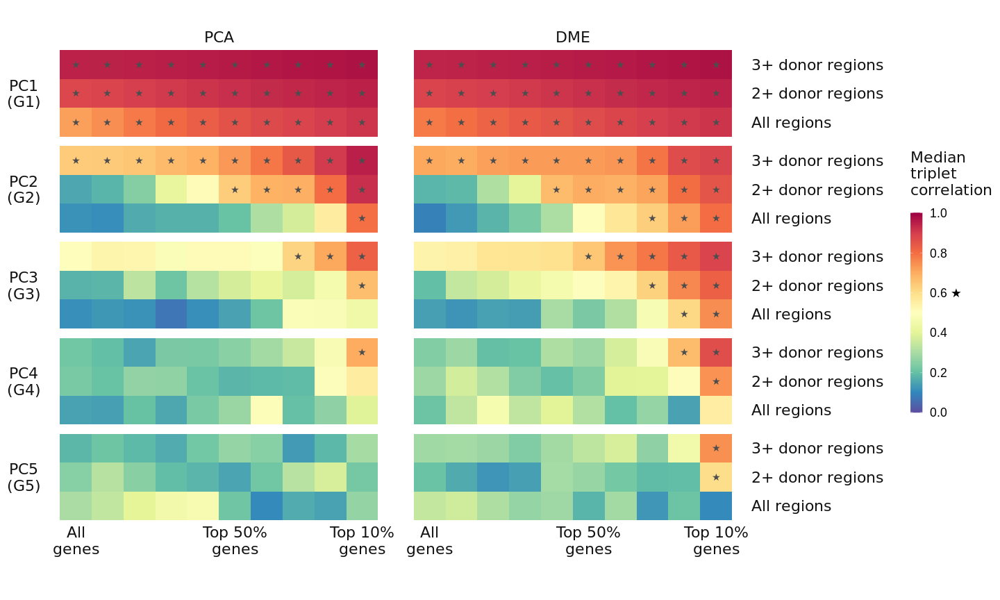

In [1769]:
%%R -w 20 -h 12 --units in -i triplets_raster
source("../code/Rplots.R")
plot_triplets_raster(triplets_raster, n_components=5, highlight='stars')

In [679]:
kpca_3d_ds5 = gradientVersion(approach='pca', kernel='pearson').fit('hcp_3donors_ds5')
# pca_3d_ds5 = gradientVersion(approach='pca', kernel=None).fit('hcp_3donors_ds5')

New gradients version: method=pca, kernel=pearson, sparsity=0, data=hcp_3donors_ds5


In [680]:
dme_3d_ds5.corr_scores(kpca_3d_ds5)

,0,1,2,3,4
0,0.985431,0.020332,-0.015892,0.056022,-0.009935
1,-0.012366,0.959248,-0.135257,-0.076864,0.109974
2,0.006250,0.171561,0.939521,-0.016929,-0.028562
3,0.083043,-0.100211,0.039736,-0.940557,-0.013772
4,-0.032790,0.138022,-0.189380,-0.111099,-0.763521


In [678]:
dme_3d_ds5.corr_scores(pca_3d_ds5)

,0,1,2,3,4
0,0.995536,0.010603,-0.000564,0.015593,0.017369
1,-0.011255,0.972787,-0.137597,0.080125,-0.009715
2,0.006713,0.186205,0.882754,-0.138068,-0.168214
3,-0.031469,-0.036881,0.178268,0.912267,0.188089
4,0.016027,0.001373,-0.320939,0.217466,-0.738979


### Parcellation

In [1045]:
get_expression_abagen(fetch_schaefer(size=400), gene_stability_threshold=0.8, save_name='s400_ds8')

3190 genes remain               after filtering for top 0.2 stability


gene_symbol,A1BG,ABCA5,ABCA6,ABCA9,ABCC12,ABCC5,ABCC8,ABCG4,ABCG5,ABHD12,...,ZNRF1,ZPR1,ZRANB3,ZSCAN18,ZSCAN29,ZSCAN31,ZSCAN9,ZSWIM4,ZSWIM9,ZYX
label,,,,,,,,,,,,,,,,,,,,,
2,0.475877,0.648281,0.683120,0.591255,0.304834,0.762725,0.716932,0.654968,0.321188,0.719116,...,0.419797,0.251226,0.439890,0.279938,0.654725,0.735078,0.766394,0.699715,0.287828,0.704146
3,0.402134,0.667325,0.725160,0.703138,0.477643,0.695783,0.785770,0.663776,0.268297,0.623212,...,0.262812,0.309623,0.248355,0.341232,0.673178,0.641791,0.708107,0.626661,0.344903,0.741916
4,0.191526,0.673051,0.772590,0.696650,0.280423,0.621458,0.797977,0.598852,0.355796,0.537804,...,0.287615,0.201261,0.321973,0.161460,0.596003,0.738561,0.705432,0.665371,0.219011,0.747670
5,0.213300,0.844923,0.711770,0.777585,0.340540,0.893793,0.945879,0.768927,0.302349,0.516080,...,0.161435,0.122493,0.299885,0.107275,0.811046,0.647757,0.780779,0.885092,0.271830,0.911812
6,0.315628,0.532894,0.785290,0.621851,0.466099,0.668493,0.769439,0.648998,0.384216,0.587228,...,0.271288,0.465681,0.440820,0.283910,0.566545,0.697605,0.771910,0.553703,0.245335,0.855356
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
177,0.558225,0.419114,0.430208,0.453430,0.695559,0.465625,0.548204,0.449731,0.641915,0.536553,...,0.469362,0.521095,0.612274,0.596929,0.600004,0.547202,0.521786,0.451487,0.544554,0.506523
178,0.619044,0.388184,0.482562,0.332611,0.629395,0.391917,0.500509,0.480997,0.616417,0.548841,...,0.516796,0.570697,0.418840,0.421186,0.568355,0.191651,0.390995,0.550667,0.636919,0.520115
179,0.547336,0.443413,0.474370,0.517652,0.500566,0.188770,0.409415,0.374653,0.449119,0.404469,...,0.577631,0.568210,0.342349,0.272758,0.660582,0.239189,0.271496,0.536394,0.512113,0.401466


In [1046]:
dm_dk_ds8 = gradientVersion(approach='dm').fit('dk_ds8')
dm_dx_ds8 = gradientVersion(approach='dm').fit('dx_ds8')
dm_s400_ds8 = gradientVersion(approach='dm').fit('s400_ds8')

New gradients version: method=dm, kernel=normalized_angle, sparsity=0, data=dk_ds8
New gradients version: method=dm, kernel=normalized_angle, sparsity=0, data=dx_ds8
New gradients version: method=dm, kernel=normalized_angle, sparsity=0, data=s400_ds8


In [1047]:
hcp_scores = dm_hcp_ds8.clean_scores().assign(version='HCP-MMP1.0')
dk_scores = dm_dk_ds8.clean_scores().assign(version='Desikan-Killiany')
dx_scores = dm_dx_ds8.clean_scores().assign(version='Desterieux')
s400_scores = (dm_s400_ds8.scores
             .apply(lambda x: (x-np.mean(x))/np.std(x))
             .join(get_labels_schaefer(size=400))
             .assign(version='Schaefer-400')
            )

In [1048]:
corrs_dict = {
    'HCP-MMP1.0': correlate(dm_hcp_ds8.fit_weights(overwrite=False), dm_hcp_ds8.weights),
    'Desikan-Killiany': correlate(dm_dk_ds8.fit_weights(), dm_hcp_ds8.weights),
    'Desterieux': correlate(dm_dx_ds8.fit_weights(), dm_hcp_ds8.weights),    
    'Schaefer-400': correlate(dm_s400_ds8.fit_weights(), dm_hcp_ds8.weights)

}

weight_corrs = (pd.concat(corrs_dict)
 .melt(ignore_index=False)
 .reset_index()
 .set_axis(['version','x','y','corr'], axis=1)
 .loc[lambda x: (x['x'] < 3) & (x['y'] < 3)]
 .replace({'x':{0:'G1',1:'G2',2:'G3'}, 'y':{0:'G1',1:'G2',2:'G3'}})
)

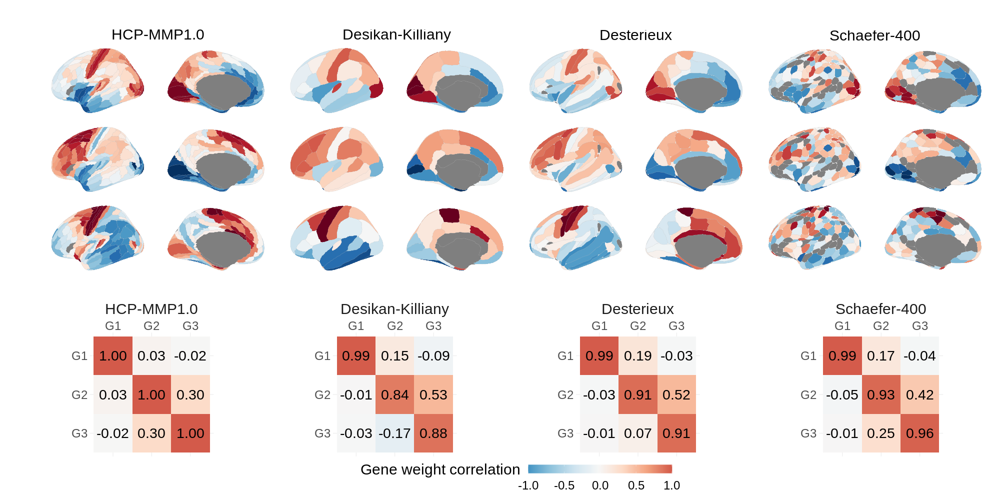

In [1049]:
%%R -w 2000 -h 1000 -i hcp_scores -i dk_scores -i dx_scores -i s400_scores -i weight_corrs 
source("../code/Rplots.R")
source("../code/brainPlots.R")

g1a <- plot_hcp(hcp_scores)
g1b <- plot_dk(dk_scores) + plot_layout(tag_level='new')
g1c <- plot_dx(dx_scores) + plot_layout(tag_level='new')
g1d <- plot_schaefer(s400_scores, size=400) + plot_layout(tag_level='new')

g2 <- plot_weight_corrs(weight_corrs, spacing=14, ylab='HCP-MMP1.0')


plot <- (
    ((g1a | g1b | g1c | g1d) & theme(legend.position='none', strip.text.y=element_blank())) /
    g2
) + plot_layout(heights=c(2,1))


themed <- plot & theme(
    text=element_text(size=30),
    legend.title=element_text(vjust=1),
    strip.text.x = element_text(size=30)
)
themed

### Hawrylycz 2012 PCs

In [413]:
hawrylycz_pcs = pd.read_csv("../data/hawrylycz2012_1000genePCs.csv")
hawrylycz_pcs_brain1 = hawrylycz_pcs.iloc[:,:11].set_index('Gene.B1').rename({'PC 1':'PC1','PC 2':'PC2','PC 3':'PC3'}, axis=1)
hawrylycz_pcs_brain2 = hawrylycz_pcs.iloc[:,11:].set_index('Gene.B2').rename({'PC 1.1':'PC1','PC 2.1':'PC2','PC 3.1':'PC3'}, axis=1)

hawrylycz_pcs = pd.concat({
    'Brain 1 genes': hawrylycz_pcs_brain1.loc[:, ['PC1','PC2','PC3']], 
    'Brain 2 genes': hawrylycz_pcs_brain2.loc[:, ['PC1','PC2','PC3']]
})
hawrylycz_pcs

PC1       PC2       PC3
Brain 1 genes FXYD6       0.983016 -0.033648 -0.018557
              TUBB2A      0.982698  0.023474  0.025298
              SUMO3       0.979685 -0.027263  0.028489
              POLR3K      0.979399  0.040162  0.025744
              MTCH1       0.978731  0.031108 -0.026919
...                            ...       ...       ...
Brain 2 genes TUBB2B      0.501143  0.035008  0.074143
              TNN         0.696344  0.074340  0.030996
              GPC5        0.938291 -0.139395 -0.191785
              THC2555234 -0.499592  0.456087 -0.455869
              TLR4        0.875941 -0.033911 -0.001080

[2000 rows x 3 columns]

In [414]:
hawrylycz_pcs_corr = (weights.set_axis(['G1','G2','G3'], axis=1)
                      .join(hawrylycz_pcs.reset_index(0).rename({'level_0':'brain'}, axis=1))
                      .dropna()
                      .groupby('brain')
                      .apply(lambda x: x.corr().iloc[:3,3:])
)
hawrylycz_pcs_corr

PC1       PC2       PC3
brain                                         
Brain 1 genes G1 -0.832826  0.512377  0.024136
              G2  0.346635  0.525968 -0.630628
              G3 -0.443305 -0.346019 -0.403887
Brain 2 genes G1 -0.855138 -0.127612 -0.015488
              G2 -0.225391 -0.347048  0.756998
              G3 -0.108169  0.474064  0.307991

In [405]:
donor1 = '9861'
donor2 = '10021'

# donor1_expression = get_expression_abagen(fetch_hcp(), save_name='base_donor1', donors=donor1, probe_selection='max_intensity')
# donor2_expression = get_expression_abagen(fetch_hcp(), save_name='base_donor2', donors=donor2, probe_selection='max_intensity')

donor1_expression = donor1_expression.dropna(how='all', axis=0).dropna(how='all', axis=1)
donor2_expression = donor2_expression.dropna(how='all', axis=0).dropna(how='all', axis=1)

In [420]:
def compute_PCs_and_correlate_weights(expression, genes, weights=weights):
    return (expression.loc[:,lambda x: np.intersect1d(x.columns, genes)]
    .pipe(lambda x: pd.DataFrame(PCA(n_components=3).fit(x).components_.T, index=x.columns))
    .set_axis(['PC1','PC2','PC3'], axis=1)
    .join(weights.set_axis(['G1','G2','G3'], axis=1))
    .corr().iloc[3:,:3]
    )

hawrylycz_genes_single_brain_pca_corr = pd.concat({
    'Brain 1 genes': compute_PCs_and_correlate_weights(donor1_expression, hawrylycz_pcs_brain1.index),
    'Brain 2 genes': compute_PCs_and_correlate_weights(donor2_expression, hawrylycz_pcs_brain2.index)
})

all_genes_single_brain_pca_corr = pd.concat({
    'Brain 1 genes': compute_PCs_and_correlate_weights(donor1_expression, donor1_expression.columns),
    'Brain 2 genes': compute_PCs_and_correlate_weights(donor2_expression, donor1_expression.columns)
})

hawrylycz_genes_base_pca_corr = pd.concat({
    'Brain 1 genes': compute_PCs_and_correlate_weights(pca_base.expression, hawrylycz_pcs_brain1.index),
    'Brain 2 genes': compute_PCs_and_correlate_weights(pca_base.expression, hawrylycz_pcs_brain2.index)
})

hawrylycz_genes_3d_ds5_pca_corr = pd.concat({
    'Brain 1 genes': compute_PCs_and_correlate_weights(dme_3d_ds5.expression, hawrylycz_pcs_brain1.index),
    'Brain 2 genes': compute_PCs_and_correlate_weights(dme_3d_ds5.expression, hawrylycz_pcs_brain2.index)
})
all_genes_single_brain_pca_corr

In [427]:
# compute_PCs_and_correlate_weights(donor1_expression, hawrylycz_pcs_brain1.index, weights=hawrylycz_pcs_brain1.loc[:,['PC1','PC2','PC3']])
# compute_PCs_and_correlate_weights(donor2_expression, hawrylycz_pcs_brain2.index, weights=hawrylycz_pcs_brain2.loc[:,['PC1','PC2','PC3']])

,PC1,PC2,PC3
G1,-0.851855,-0.045635,0.178829
G2,-0.141275,-0.109012,0.283583
G3,0.002883,-0.638594,-0.526596


In [415]:
df_hawrylycz_corr = (pd.concat({
    'PCs from Hawrylycz 2012:\n1000 most-variable genes\nfrom single-brain data\nin 56-gyri parcellation': hawrylycz_pcs_corr,
    'Same 1000 most-variable genes,\nPCs from single-brain data\nin HCP-MMP parcellation': hawrylycz_genes_single_brain_pca_corr,
    'Same 1000 most-variable genes,\nPCs from unfiltered 6-brain data\nin HCP-MMP parcellation': hawrylycz_genes_base_pca_corr,
    'Same 1000 most-variable genes,\nPCs from filtered 6-brain data\nin HCP-MMP parcellation': hawrylycz_genes_3d_ds5_pca_corr
}).melt(ignore_index=False, var_name='PC', value_name='r')
.reset_index().rename({'level_0':'data', 'level_2':'G'}, axis=1)
)

,data,brain,G,PC,r
0,PCs from Hawrylycz 2012:\n1000 most-variable g...,Brain 1 genes,G1,PC1,-0.832826
1,PCs from Hawrylycz 2012:\n1000 most-variable g...,Brain 1 genes,G2,PC1,0.346635
2,PCs from Hawrylycz 2012:\n1000 most-variable g...,Brain 1 genes,G3,PC1,-0.443305
3,PCs from Hawrylycz 2012:\n1000 most-variable g...,Brain 2 genes,G1,PC1,-0.855138
4,PCs from Hawrylycz 2012:\n1000 most-variable g...,Brain 2 genes,G2,PC1,-0.225391
...,...,...,...,...,...
67,"Same 1000 most-variable genes,\nPCs from filte...",Brain 1 genes,G2,PC3,0.151123
68,"Same 1000 most-variable genes,\nPCs from filte...",Brain 1 genes,G3,PC3,0.908770
69,"Same 1000 most-variable genes,\nPCs from filte...",Brain 2 genes,G1,PC3,0.011885
70,"Same 1000 most-variable genes,\nPCs from filte...",Brain 2 genes,G2,PC3,-0.141741


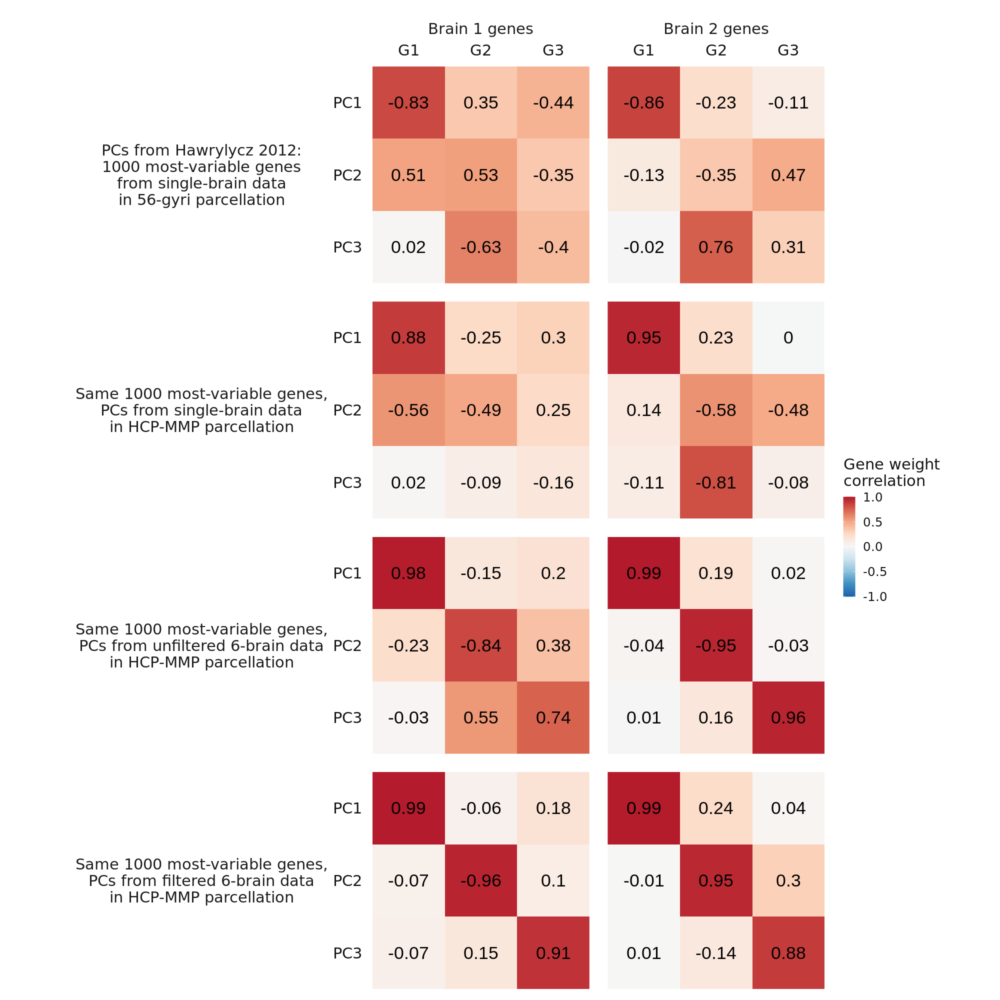

In [416]:
%%R -i df_hawrylycz_corr -w 20 -h 20 -u in -r 100
df_hawrylycz_corr %>% 
mutate(data=factor(data, ordered=T, levels=unique(.$data))) %>% 
ggplot(aes(x=G, y=PC)) + 
facet_grid(data~brain, switch='y') +
geom_raster(aes(fill=abs(r))) +
geom_text(aes(label=round(r,2)), vjust=.5, hjust=.5, size=9, color='black') +
scale_fill_gradientn(colors=rev(brewer.rdbu(100))[10:90], limits=c(-1,1),
                     name='Gene weight\ncorrelation') +
scale_x_discrete(position='top') +
scale_y_discrete(limits=rev) +
guides(fill=guide_colorbar(barheight=10)) +
xlab('') + ylab('') +
theme_minimal() +
theme(panel.grid=element_blank(),
        text = element_text(size=22, color='grey7', family='Calibri'),
        axis.text = element_text(size=22, color='grey7', family='Calibri'),
        legend.title=element_text(vjust=1),
        legend.position='right',
        aspect.ratio=1,
        strip.placement='outside',
        strip.text.y.left = element_text(angle=0, vjust=.5, size=22),
        strip.text = element_text(angle=0, vjust=1, size=22)
        )

### Burt single gene enrichments

In [1097]:
burt_genes = ['CORT','CALB1','SST','PVALB','CCK','NPY','PNOC','CALB2','VIP']
burt_genes = pd.DataFrame({'gene':burt_genes, 'label':burt_genes})
burt_stats = compute_null_p(*compute_enrichments(weights, nulls, burt_genes))

In [ ]:
layer_genes = get_layer_genes(which='maynard', add_hse_genes=False)
layer_stats = compute_null_p(*compute_enrichments(weights, nulls, layer_genes))

In [1113]:
grin_genes = ['GRIN' + x for x in ['3A','2B','2C','2A','A','1','3B','2D']]
gabra_genes = ['GABRA' + x for x in ['3','5','2','1','4']]
grin_gabra_genes = grin_genes + gabra_genes
grin_gabra_genes = pd.DataFrame({'gene':grin_gabra_genes, 'label':grin_gabra_genes})
grin_gabra_stats = compute_null_p(*compute_enrichments(weights, nulls, grin_gabra_genes))

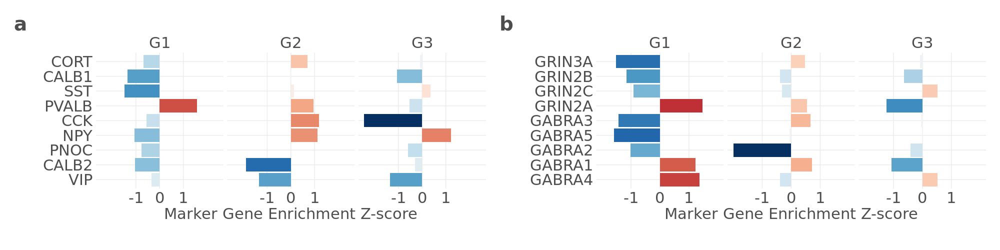

In [1128]:
%%R -i burt_stats -i grin_gabra_stats -w 20 -h 5 --units in -r 100
g1 = plot_enrichment_bars_z(burt_stats, xlab='Marker Gene Enrichment Z-score')
g2 = plot_enrichment_bars_z(grin_gabra_stats, xlab='Marker Gene Enrichment Z-score')

((g1 | g2) &theme(
  text=element_text(size=22, color='grey30', family='Calibri'), 
  axis.text=element_text(size=22, color='grey30', family='Calibri'),
  strip.text=element_text(size=22, color='grey30', family='Calibri'),
  legend.text=element_text(size=22, color='grey30', family='Calibri'),
    plot.margin = margin(t=10, r=10, b=20, l=10, "pt"),
    plot.tag = element_text(size=28, face='bold', family='Calibri', hjust=0)
)) + plot_annotation(tag_level='a')

### Neuron subtype enrichments

In [1121]:
lake_subtypes = get_cell_genes(which='jakob', include='lake_plus_glia', subtype=True, combine_layers=False)
order = (lake_subtypes
         .assign(neuro = lambda x: [False if c in ['Endo', 'Oligo', 'Micro', 'OPC', 'Astro'] else True for c in x.label])
         .assign(ex_in = lambda x: [False if 'In' in c else True for c in x.label])
         .sort_values(['neuro', 'ex_in'], ascending=False).label.unique()
        )

lake_stats = compute_null_p(*compute_enrichments(weights, nulls, lake_subtypes), order=order)

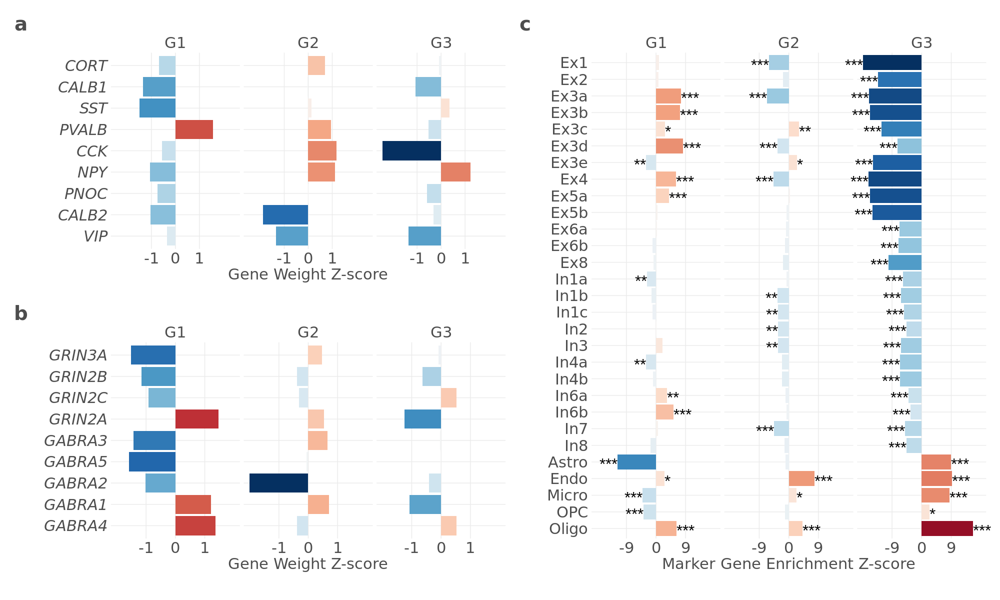

In [1134]:
%%R -i lake_stats -w 20 -h 12 --units in -r 100
g1 = plot_enrichment_bars_z(burt_stats, xlab='Gene Weight Z-score') + theme(axis.text.y=element_text(face='italic'))
g2 = plot_enrichment_bars_z(grin_gabra_stats, xlab='Gene Weight Z-score') + theme(axis.text.y=element_text(face='italic'))
g3 = plot_enrichment_bars_z(lake_stats, xlab='Marker Gene Enrichment Z-score') 

(((g1 / g2) | g3) & theme(
  text=element_text(size=22, color='grey30', family='Calibri'), 
  axis.text=element_text(size=22, color='grey30', family='Calibri'),
  strip.text=element_text(size=22, color='grey30', family='Calibri'),
  legend.text=element_text(size=22, color='grey30', family='Calibri'),
    plot.margin = margin(t=10, r=10, b=20, l=10, "pt"),
    plot.tag = element_text(size=28, face='bold', family='Calibri', hjust=0)
)) + plot_annotation(tag_level='a')

### MRI PCA permutations 

In [1204]:
version = dm_hcp_3d_ds5
pca_scores, pca_var, pca_weights = maps_pca(maps_for_pca)
corrs = get_corrs(version.clean_scores(), pca_scores).abs()
matches = version.match_components(corrs, n_components=3)

var = pd.Series(pca_var, index=['MRI PC1','MRI PC2', 'MRI PC3'], name='var')

MRI_PC = [ix[0] for ix in matches[0]]
G = [ix[1] for ix in matches[0]]
pca_corrs_all = (pd.DataFrame({'G':G, 'r':matches[1], 'MRI_PC':MRI_PC})
                 .set_index('MRI_PC').join(var).reset_index()
                )
pca_corrs_all

,MRI_PC,G,r,var
0,MRI PC2,G1,0.711834,0.199709
1,MRI PC1,G2,0.591680,0.311035
2,MRI PC3,G3,0.023040,0.140943


In [2259]:
# pca_corrs_boot = {
#     'pca_corrs_boot_9' : maps_pca_boot(dm_hcp_3d_ds5, maps, n_boot=10, n_sample=9, replace=False),
#     'pca_corrs_boot_8' : maps_pca_boot(dm_hcp_3d_ds5, maps, n_boot=10, n_sample=8, replace=False),
#     'pca_corrs_boot_7' : maps_pca_boot(dm_hcp_3d_ds5, maps, n_boot=10, n_sample=7, replace=False),
#     'pca_corrs_boot_6' : maps_pca_boot(dm_hcp_3d_ds5, maps, n_boot=10, n_sample=6, replace=False),
#     'pca_corrs_boot_5' : maps_pca_boot(dm_hcp_3d_ds5, maps, n_boot=10, n_sample=5, replace=False)
# }
# pca_corrs_boot = pd.concat(pca_corrs_boot)
pca_corrs_boot = maps_pca_boot(dm_hcp_3d_ds5, maps, n_boot=10000, n_sample=10, replace=True)

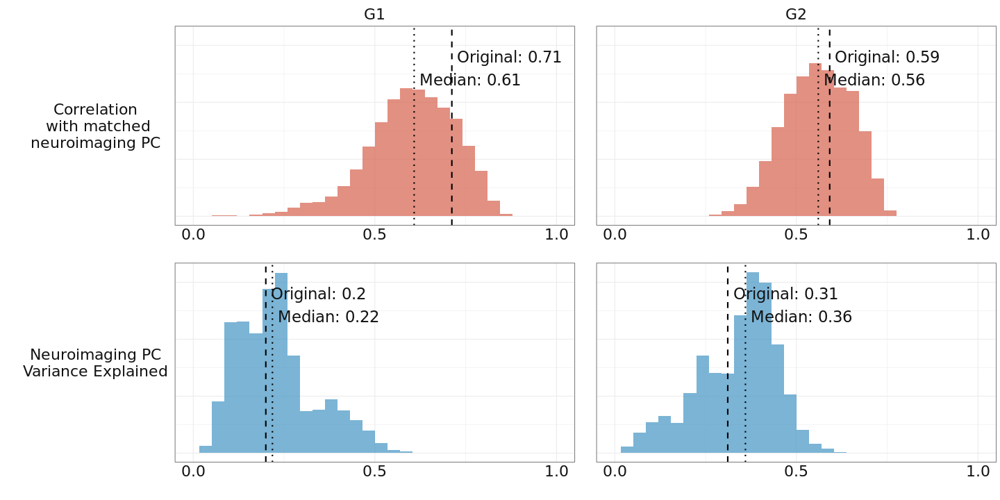

In [2266]:
%%R -i pca_corrs_all -i pca_corrs_boot -w 20 -h 10 --units in
source("../code/plot_maps.R")
plot_maps_pca_boot(pca_corrs_all %>% filter(G!='G3'), pca_corrs_boot %>% filter(G!='G3'))

### VE & Yeo

In [ ]:
hcp_scores = dm_hcp_3d_ds5.clean_scores()
null_scores = np.load('../outputs/permutations/hcp_3d_ds5_spin_5000.npy')

In [2151]:
mesulam_ve_yeo.head()

,label,Mesulam,Mesulam_colors,Mesulam_names,Yeo,Yeo_colors,Yeo_names,vonEconomo,vonEconomo_colors,vonEconomo_names,x,y,z,G1,G2,G3
1,V1,4,#80B1D3,Idiotypic,1,#660066,Visual,5,#fffb00,Sensory 1,11.210,49.816,35.575,2.118002,-2.126003,1.871407
2,MST,3,#FB8072,Unimodal,1,#660066,Visual,4,#f59505,Sensory 2,36.250,34.011,37.570,NaN,NaN,NaN
3,V6,3,#FB8072,Unimodal,1,#660066,Visual,4,#f59505,Sensory 2,10.096,35.750,55.243,NaN,NaN,NaN
4,V2,4,#80B1D3,Idiotypic,1,#660066,Visual,4,#f59505,Sensory 2,11.179,46.890,36.613,2.047980,-1.772881,1.459301
5,V3,4,#80B1D3,Idiotypic,1,#660066,Visual,4,#f59505,Sensory 2,14.580,47.879,37.700,2.032762,-1.899769,1.275806


In [2189]:
atlas_data = pd.read_csv('../data/mesulam_ve_yeo.csv', index_col=0).join(hcp_scores.set_index('label'), on='label')
atlas_stats = {}
for atlas in ['Mesulam', 'vonEconomo', 'Yeo']:
    atlas_regions = atlas_data[atlas].dropna()
    true_means, null_means = compute_region_means(hcp_scores, null_scores, atlas_regions, method='mean')
    atlas_scores_sig = compute_null_p(true_means, null_means, adjust='fdr_bh').assign(label=lambda x: x['label'].astype('string'))
    atlas_colors = (atlas_data.loc[:,[atlas, f'{atlas}_names', f'{atlas}_colors']].set_axis(['label','name','color'],axis=1)
                  .drop_duplicates().assign(label=lambda x: x['label'].astype('string')))
    atlas_stats[atlas] = atlas_scores_sig.join(atlas_colors.set_index('label'), on='label')
atlas_stats = pd.concat(atlas_stats).reset_index(0).rename({'level_0':'atlas'}, axis=1)

/home/jovyan/work/notebooks/../code/mri_maps.py:307: RuntimeWarning: Mean of empty slice
  true[region] = pd.Series(np.nanmean(scores_array[mask, :], axis=0))
/home/jovyan/work/notebooks/../code/mri_maps.py:308: RuntimeWarning: Mean of empty slice
  null[region] = pd.DataFrame(np.nanmean(null_scores[mask, :, :], axis=0)).T
/home/jovyan/work/notebooks/../code/mri_maps.py:308: RuntimeWarning: Mean of empty slice
  null[region] = pd.DataFrame(np.nanmean(null_scores[mask, :, :], axis=0)).T
/home/jovyan/work/notebooks/../code/mri_maps.py:307: RuntimeWarning: Mean of empty slice
  true[region] = pd.Series(np.nanmean(scores_array[mask, :], axis=0))
/home/jovyan/work/notebooks/../code/mri_maps.py:308: RuntimeWarning: Mean of empty slice
  null[region] = pd.DataFrame(np.nanmean(null_scores[mask, :, :], axis=0)).T


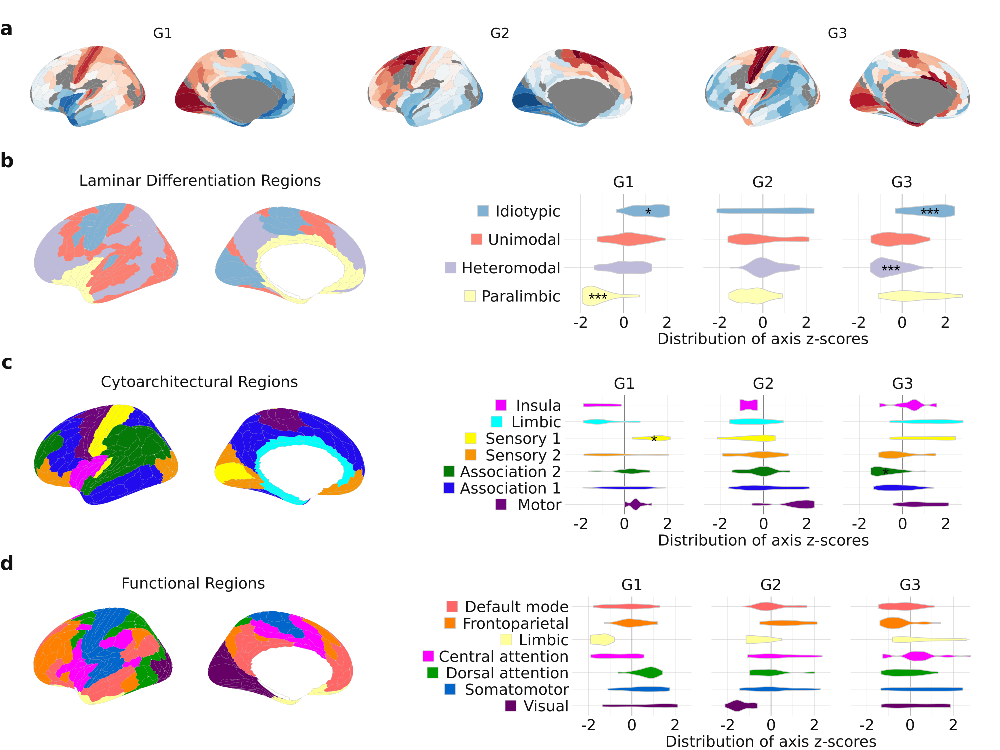

In [2250]:
%%R -w 20 -h 15 --units in -r 200 -i atlas_stats -i atlas_data
source("../code/plot_maps.R")
source("../code/Rplots.R")

g1 <- plot_hcp_wide(hcp_scores) + guides(fill='none') + theme(legend.margin=margin(t = -40, unit='pt'),
                                                              plot.tag.position = c(0, .95))
g2 = plot_hcp_classes(atlas_data, classes=Mesulam, classcolors=Mesulam_colors, classnames=Mesulam_names, ncol=4) +
    ggtitle('Laminar Differentiation Regions')
g2a = plot_atlas_violins(atlas_data, atlas_stats %>% filter(atlas=='Mesulam')) + plot_layout(tag_level='new') +
    theme(strip.text=element_text(size=22, color='grey7', family='Calibri'))

g3 = plot_hcp_classes(atlas_data, classes=vonEconomo, classcolors=vonEconomo_colors, classnames=vonEconomo_names, ncol=4) +
    ggtitle('Cytoarchitectural Regions')
g3a = plot_atlas_violins(atlas_data, atlas_stats %>% filter(atlas=='vonEconomo'), 
        classes=vonEconomo, classcolors=vonEconomo_colors, classlabels=vonEconomo_names,
        legend_positions=c(-5.1,-7.5,-7.5,-6.5,-6.5,-5.3,-5.1)-.6) + plot_layout(tag_level='new')

g4 = plot_hcp_classes(atlas_data, classes=Yeo, classcolors=Yeo_colors, classnames=Yeo_names, ncol=4) +
    ggtitle('Functional Regions')
g4a = plot_atlas_violins(atlas_data, atlas_stats %>% filter(atlas=='Yeo'), 
        classes=Yeo, classcolors=Yeo_colors, classlabels=Yeo_names,
        legend_positions=c(-5.1,-7.9,-8.7,-8.9,-5.3,-7.9,-7.8)-.5) + plot_layout(tag_level='new')

plot <- g1 / 
        ((g2 | plot_spacer() | g2a) + plot_layout(widths=c(10,1,12))) /
        ((g3 | plot_spacer() | g3a) + plot_layout(widths=c(10,1,12))) /
        ((g4 | plot_spacer() | g4a) + plot_layout(widths=c(10,1,12)))

(plot & theme(
    legend.position='none', 
    plot.title=element_text(hjust=0.5, size=22, color='grey7', family='Calibri',margin=margin(b=-30)),
    text=element_text(size=22, color='grey7', family='Calibri'), 
    strip.text=element_text(size=22, color='grey7', family='Calibri'),
    # legend.text=element_text(size=22, color='grey7', family='Calibri'),
    plot.margin = margin(t=10, r=10, b=0, l=0, "pt"),

    plot.tag = element_text(size=28, face='bold', family='Calibri', hjust=0, vjust=1)
)) + plot_annotation(tag_level='a')

### Brainchart Maps

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


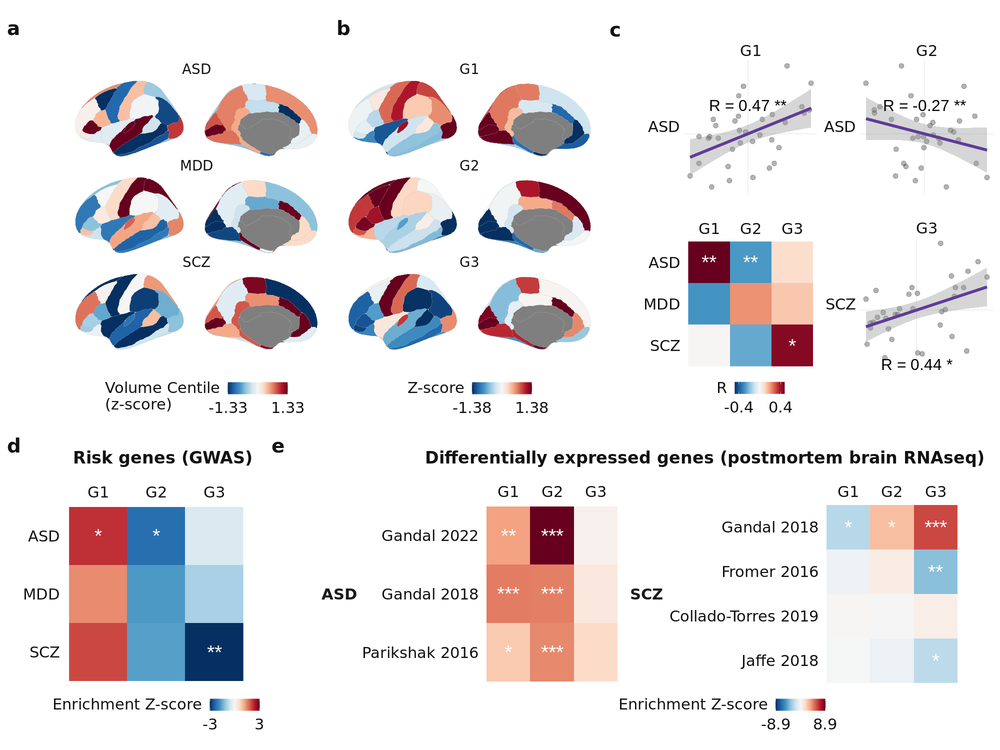

In [ ]:
%%R -w 20 -h 15 --units in -r 100
themed <- ((plot_brainchart / plot_gwas_degs) + plot_layout(heights=c(5,3))) & theme(
    text=element_text(size=22, color='grey7', family='Calibri'), 
    # strip.text=element_text(size=22, color='grey7', family='Calibri'),
    legend.text=element_text(size=22, color='grey7', family='Calibri'),
    plot.margin = margin(t=5, r=5, b=10, l=5, "pt"),
    # plot.tag.position = c(0, 1),
    plot.tag = element_text(size=28, face='bold', family='Calibri', hjust=0)
)

themed + plot_annotation(tag_level='a')

In [ ]:
deg_genes_scz = get_deg_combined(scz_only=True)
deg_genes_scz

,label,gene
0,Gandal 2018,TSPAN6
4,Gandal 2018,C1orf112
11,Gandal 2018,NIPAL3
14,Gandal 2018,SEMA3F
17,Gandal 2018,CYP51A1
...,...,...
453,Jaffe 2018,ATG4D
454,Jaffe 2018,RLIM
456,Jaffe 2018,KCNC3
457,Jaffe 2018,TMEM38A


In [ ]:
deg_genes_scz['gene'].drop_duplicates().shape

(5235,)

In [ ]:
scz_deg_up = deg_genes_scz.loc[lambda x: x['log2FC'] > 0]
# scz_deg_up
scz_deg_up_stats = compute_null_p(*compute_enrichments(weights, null_weights, scz_deg_up))
scz_deg_up_stats

,label,G,pct,true_mean,null_mean,null_std,z,pos,p,q,sig,n_genes,n_matches
0,Gandal 2018,G1,0.0000,-0.004565,-0.000631,0.000311,-12.653619,False,0.0000,0.000000,True,2450,1133
1,Gandal 2018,G2,0.0000,-0.000572,0.000917,0.000311,-4.793254,False,0.0000,0.000000,True,2450,1133
2,Gandal 2018,G3,0.9924,0.000476,-0.000253,0.000306,2.379691,True,0.0152,0.020267,True,2450,1133
3,Fromer 2016,G1,0.0000,-0.003885,-0.000655,0.000834,-3.873279,False,0.0000,0.000000,True,329,173
4,Fromer 2016,G2,0.0006,-0.001809,0.000929,0.000845,-3.237945,False,0.0012,0.002057,True,329,173
5,Fromer 2016,G3,0.0544,-0.001624,-0.000247,0.000854,-1.612672,False,0.1088,0.118691,False,329,173
6,Collado-Torres 2019,G1,0.0000,-0.010909,-0.000659,0.001320,-7.762423,False,0.0000,0.000000,True,96,70
7,Collado-Torres 2019,G2,0.0000,-0.004536,0.000921,0.001329,-4.104201,False,0.0000,0.000000,True,96,70
8,Collado-Torres 2019,G3,0.0154,-0.003041,-0.000213,0.001329,-2.128439,False,0.0308,0.036960,True,96,70
9,Jaffe 2018,G1,0.0000,-0.008563,-0.000640,0.001885,-4.203265,False,0.0000,0.000000,True,101,36


In [ ]:
# scz_deg_gwas = deg_genes_scz.assign(label = lambda x: np.isin(x['gene'], gwas_genes.query("label=='SCZ'")['gene'])).drop_duplicates()
scz_deg_gwas = deg_genes_scz.loc[lambda x: np.isin(x['gene'], gwas_genes.query("label=='SCZ'")['gene'])]
scz_deg_gwas_stats = compute_null_p(*compute_enrichments(weights, null_weights, scz_deg_gwas))
scz_deg_gwas_stats

,label,G,pct,true_mean,null_mean,null_std,z,pos,p,q,sig,n_genes,n_matches
0,Gandal 2018,G1,0.8118,0.000718,-0.000600,0.001492,0.883144,True,0.3764,0.7528,False,102,55
1,Gandal 2018,G2,0.6508,0.001484,0.000897,0.001497,0.392633,True,0.6984,0.9744,False,102,55
2,Gandal 2018,G3,0.1390,-0.001893,-0.000262,0.001497,-1.089277,False,0.2780,0.6672,False,102,55
3,Fromer 2016,G1,0.8720,0.005914,-0.000655,0.005635,1.165927,True,0.2560,0.6672,False,14,4
4,Fromer 2016,G2,0.5128,0.001167,0.000911,0.005628,0.045589,True,0.9744,0.9744,False,14,4
5,Fromer 2016,G3,0.1212,-0.006922,-0.000312,0.005677,-1.164491,False,0.2424,0.6672,False,14,4
6,Collado-Torres 2019,G1,0.9814,0.014139,-0.000513,0.007922,1.849410,True,0.0372,0.2976,False,2,2
7,Collado-Torres 2019,G2,0.5794,0.002791,0.001136,0.007922,0.209005,True,0.8412,0.9744,False,2,2
8,Collado-Torres 2019,G3,0.4672,-0.000801,-0.000164,0.007834,-0.081302,False,0.9344,0.9744,False,2,2
9,Jaffe 2018,G1,0.6400,0.006912,-0.000666,0.011202,0.676517,True,0.7200,0.9744,False,2,1


In [ ]:
scz_deg_n_studies = (deg_genes_scz
                     .join(deg_genes_scz.groupby('gene')['gene'].count().rename('n_degs'), on='gene')
                     .assign(n_degs = lambda x: np.where(x['n_degs']>1,'2+','1'))
                     .assign(label = lambda x: x['n_degs']).drop_duplicates()
                    #  .assign(in_gwas = lambda x: np.isin(x['gene'], gwas_genes.query("label=='SCZ'")['gene']))
                    #  .groupby(['in_gwas','n_degs']).count()
)
# scz_deg_n_studies
scz_deg_n_studies_stats = compute_null_p(*compute_enrichments(weights, null_weights, scz_deg_n_studies))
scz_deg_n_studies_stats

,label,G,pct,true_mean,null_mean,null_std,z,pos,p,q,sig,n_genes,n_matches
0,1,G1,0.0028,-0.001203,-0.000627,0.000214,-2.699724,False,0.0056,0.0112,True,4729,2026
1,1,G2,0.9980,0.001568,0.000924,0.000218,2.956944,True,0.0040,0.0112,True,4729,2026
2,1,G3,1.0000,0.001137,-0.000255,0.000214,6.500130,True,0.0000,0.0000,True,4729,2026
3,2+,G1,0.4190,-0.000777,-0.000647,0.000591,-0.220838,False,0.8380,0.8940,False,506,336
4,2+,G2,0.5530,0.000995,0.000918,0.000601,0.128277,True,0.8940,0.8940,False,506,336
5,2+,G3,0.0060,-0.001771,-0.000251,0.000591,-2.570694,False,0.0120,0.0180,True,506,336


In [ ]:
two_studies_genes = (scz_deg_n_studies.query("n_degs=='2+'")
                     .assign(label = 'Two or more studies').drop('n_degs', axis=1)
)
one_study_genes = (deg_genes_scz
 .loc[lambda x: np.isin(x['gene'], scz_deg_n_studies.query("n_degs=='1'")['gene'])]
 .assign(label = lambda x: ['Only ' + study for study in x['label']])
 .assign(label = lambda x: x['label'].str.replace("Collado-\nTorres", "Collado-Torres"))
)

n_studies_labels = pd.concat([one_study_genes, two_studies_genes])

overlap_levels = n_studies_labels['label'].unique()
two_studies_plot = make_deciles_plot(weights, labels=n_studies_labels, levels=overlap_levels, na_value=np.nan).dropna()
two_studies_plot 

,gene,G,G_score,G_decile,label,rank_in_decile
13439,PTBP3,G2,-0.014148,0,Two or more studies,1
1613,CYP46A1,G1,-0.014704,0,Two or more studies,1
21499,RAB11FIP1,G3,-0.015007,0,Two or more studies,1
10970,HOOK1,G2,-0.014344,0,Two or more studies,2
45,ABLIM2,G1,-0.014763,0,Two or more studies,2
...,...,...,...,...,...,...
16548,B3GNT5,G3,0.014802,9,Only Gandal 2018,276
23104,TNFRSF10B,G3,0.014802,9,Only Gandal 2018,277
18127,FABP6,G3,0.014790,9,Only Gandal 2018,278
22318,SLC7A7,G3,0.014742,9,Only Gandal 2018,279


In [ ]:
deg_genes_scz_gwas = pd.concat([deg_genes_scz, gwas_genes.query("label=='SCZ'").assign(label='GWAS')])

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


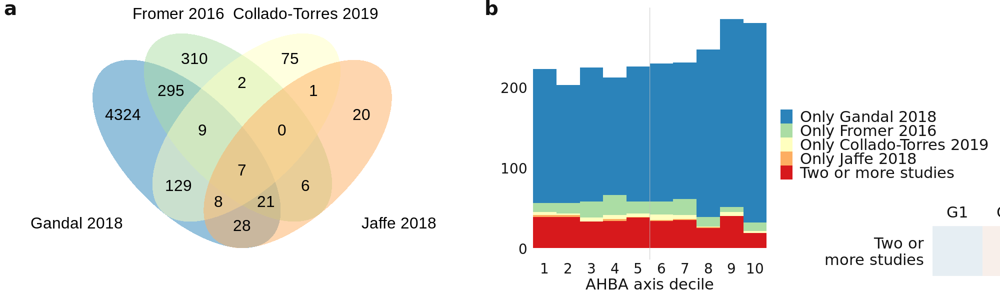

In [ ]:
%%R -i deg_genes_scz -i two_studies_plot -i scz_deg_n_studies_stats -w 20 -h 6 -u in -r 100
source("../code/brainspanPlots.R")
source("../code/enrichmentsPlots.R")
library(ggvenn)

g0 <- scz_deg_genes_list <- deg_genes_scz %>% split(.$label) %>% lapply(function(x) x$gene) %>% 
    ggvenn(text_size=8, set_name_size=8, show_percentage=F,
        fill_color=brewer.spectral(5)[-c(1)] %>% rev,
        stroke_color='black', stroke_size=0) + 
    coord_equal(clip='off')

g1 <- two_studies_plot %>% filter(G=='G3') %>% 
    plot_deciles_histogram(facet='') + 
    scale_fill_manual(values=brewer.spectral(5), name='')

g1b <- scz_deg_n_studies_stats %>% filter(label=='2+') %>% 
    mutate(label = 'Two or\nmore studies') %>% 
    plot_heatmap_simple(size=10) + 
    theme(
        # axis.text.y=element_blank(),
        legend.position='none'
    ) + 
    plot_layout(tag_level='new')

plot <- g0 | g1 + inset_element(g1b, t=.3, b=-.1, l=1, r=2.5, align_to='panel')

themed <- (plot + plot_layout(widths=c(2,1))) & theme(
    text=element_text(size=22, color='grey7', family='Calibri'),
    strip.text=element_text(size=22, color='grey7', family='Calibri'),
    legend.text=element_text(size=22, color='grey7', family='Calibri'),
    # plot.margin = margin(t=50, r=10, b=5, l=10, "pt"),
    plot.tag.position = c(0, 1),
    plot.tag = element_text(size=28, face='bold', family='Calibri', hjust=0)
)

plot_venn <- themed + plot_annotation(tag_level='a')
plot_venn

In [ ]:
# scz_deg_n_studies = deg_genes_scz.groupby('gene').count().apply(lambda x: np.where(x>1,'2+','1')).reset_index()
scz_deg_2_studies = deg_genes_scz.loc[lambda x: np.isin(x['gene'], scz_deg_n_studies.query("label=='1'")['gene'])]
# scz_deg_2_studies
scz_deg_2_studies_stats = compute_null_p(*compute_enrichments(weights, null_weights, scz_deg_2_studies))
scz_deg_2_studies_stats

,label,G,pct,true_mean,null_mean,null_std,z,pos,p,q,sig,n_genes,n_matches
0,Gandal 2018,G1,0.0030,-0.001239,-0.000628,0.000230,-2.658671,False,0.0060,0.024000,True,4324,1827
1,Gandal 2018,G2,0.9976,0.001575,0.000922,0.000235,2.780422,True,0.0048,0.024000,True,4324,1827
2,Gandal 2018,G3,1.0000,0.001442,-0.000256,0.000228,7.460553,True,0.0000,0.000000,True,4324,1827
3,Fromer 2016,G1,0.3592,-0.000958,-0.000619,0.000897,-0.378388,False,0.7184,0.783709,False,309,149
4,Fromer 2016,G2,0.8836,0.002041,0.000932,0.000911,1.216871,True,0.2328,0.399086,False,309,149
5,Fromer 2016,G3,0.1150,-0.001359,-0.000268,0.000906,-1.204451,False,0.2300,0.399086,False,309,149
6,Collado-Torres 2019,G1,0.6914,0.000281,-0.000604,0.001727,0.512295,True,0.6172,0.740640,False,75,40
7,Collado-Torres 2019,G2,0.5094,0.001021,0.000975,0.001780,0.026214,True,0.9812,0.981200,False,75,40
8,Collado-Torres 2019,G3,0.2358,-0.001471,-0.000198,0.001766,-0.720807,False,0.4716,0.628800,False,75,40
9,Jaffe 2018,G1,0.1920,-0.005814,-0.000573,0.005611,-0.934161,False,0.3840,0.576000,False,11,4


In [ ]:
not_WM_genes = get_layer_genes().query("label in ['WM']")['gene']
scz_deg_not_WM = deg_genes_scz.loc[lambda x: ~np.isin(x['gene'], not_WM_genes)]
scz_deg_not_WM_stats = compute_null_p(*compute_enrichments(weights, null_weights, scz_deg_not_WM))
scz_deg_not_WM_stats

,label,G,pct,true_mean,null_mean,null_std,z,pos,p,q,sig,n_genes,n_matches
0,Gandal 2018,G1,0.1142,-0.000934,-0.000634,0.000245,-1.222902,False,0.2284,0.548160,False,3764,1611
1,Gandal 2018,G2,0.6768,0.001037,0.000921,0.000251,0.459981,True,0.6464,0.923733,False,3764,1611
2,Gandal 2018,G3,0.0000,-0.001888,-0.000253,0.000249,-6.552929,False,0.0000,0.000000,True,3764,1611
3,Fromer 2016,G1,0.4932,-0.000648,-0.000632,0.000640,-0.025163,False,0.9864,0.986400,False,527,293
4,Fromer 2016,G2,0.7752,0.001419,0.000932,0.000632,0.769793,True,0.4496,0.770743,False,527,293
5,Fromer 2016,G3,0.0000,-0.003983,-0.000260,0.000643,-5.785323,False,0.0000,0.000000,True,527,293
6,Collado-Torres 2019,G1,0.3464,-0.001048,-0.000649,0.001004,-0.398238,False,0.6928,0.923733,False,178,124
7,Collado-Torres 2019,G2,0.1658,-0.000014,0.000926,0.000988,-0.952062,False,0.3316,0.663200,False,178,124
8,Collado-Torres 2019,G3,0.0148,-0.002444,-0.000240,0.001001,-2.201503,False,0.0296,0.088800,False,178,124
9,Jaffe 2018,G1,0.5556,-0.000410,-0.000626,0.001545,0.139509,True,0.8888,0.969600,False,78,52


### Layers plot with DEGs from each study

In [ ]:
layer_levels = ['WM','L6','L5','L4','L3','L2','L1','No layer\nannotation'][::-1]
layers_plot = make_deciles_plot(weights, labels=get_layer_genes(), levels=layer_levels, na_value='No layer\nannotation')
layers_plot_with_degs = make_deciles_plot_with_degs(layers_plot, deg_genes_scz)

### Development trajectories for DEGs from each study

Fit GAM models to all SCZ DEGs matched in BrainSpan

In [ ]:
hcp_bs_mapping = get_hcp_bs_mapping_v2()
bs_exp, bs_col, bs_row = get_brainspan()
bs_clean = clean_brainspan(bs_exp, bs_col, bs_row, hcp_bs_mapping)
bs_continuous = make_continuous(bs_clean, norm_samples=True)

In [ ]:
genes_to_fit = np.intersect1d(bs_clean.columns, deg_genes_scz['gene'].dropna())
scz_deg_genes_models = fit_gam_models(bs_continuous, genes_to_fit, alpha=.5)
scz_deg_genes_curves, scz_deg_genes_points = predict_gam_curves(scz_deg_genes_models, bs_continuous, genes_to_fit)

In [ ]:
quantiles_degs = make_quantiles_plot(weights, q=5, labels=deg_genes_scz, levels=None).dropna()
quantiles_degs

,gene,G,G_score,G_quantile,label,rank_in_quantile
10332,FCHO2,G2,-0.009647,0,Jaffe 2018,1
21003,PGP,G3,-0.010860,0,Jaffe 2018,1
2850,GXYLT2,G1,-0.012665,0,Jaffe 2018,1
14956,TIMP2,G2,-0.009899,0,Jaffe 2018,2
16165,AKIRIN2,G3,-0.010981,0,Jaffe 2018,2
...,...,...,...,...,...,...
20663,NTSR2,G3,0.009320,4,Gandal 2018,628
17286,CLEC3B,G3,0.009290,4,Gandal 2018,629
18556,GGT5,G3,0.009274,4,Gandal 2018,630
22714,SYK,G3,0.009252,4,Gandal 2018,631


In [ ]:
quantiles_age_curves_plot = (quantiles_degs
 .query("G=='G3'")
 .join(scz_deg_genes_curves.set_index('gene'), on='gene')
 .groupby(['label','G_quantile','age_log10'])
 .agg({'pred':'mean', 'gene':'count'}).rename({'gene':'n_genes'}, axis=1)
 .reset_index()
)
cquantiles_age_curves_plot

,label,G_quantile,age_log10,pred,n_genes
0,Gandal 2018,0,1.748188,0.836465,656
1,Gandal 2018,0,1.772677,0.846434,656
2,Gandal 2018,0,1.797166,0.856399,656
3,Gandal 2018,0,1.821655,0.866360,656
4,Gandal 2018,0,1.846144,0.876313,656
...,...,...,...,...,...
1995,Jaffe 2018,4,4.074647,1.365844,10
1996,Jaffe 2018,4,4.099136,1.367310,10
1997,Jaffe 2018,4,4.123625,1.368806,10
1998,Jaffe 2018,4,4.148114,1.370322,10


### New fig

`geom_smooth()` using formula = 'y ~ x'


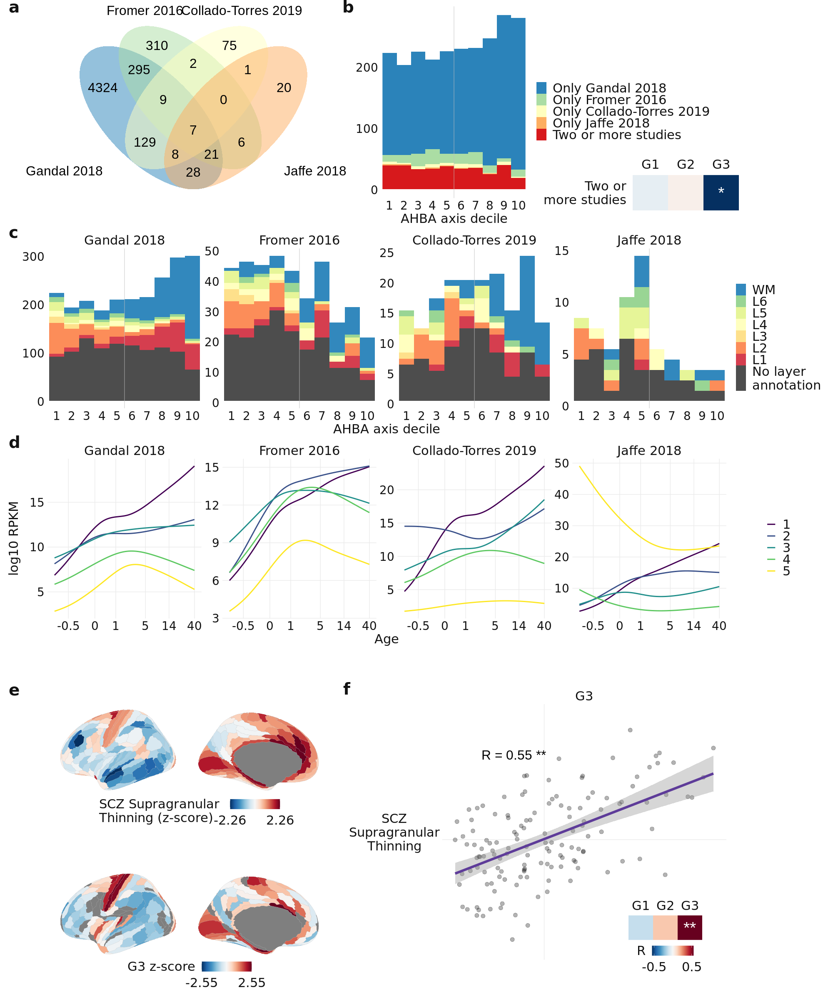

In [ ]:
%%R -i layers_plot_with_degs -i quantiles_age_curves_plot -w 20 -h 24 -u in -r 100
source("../code/brainspanPlots.R")
source("../code/enrichmentsPlots.R")

g1 <- layers_plot_with_degs %>% filter(G=='G3') %>% 
    plot_deciles_histogram + theme(plot.tag.position = c(0, 1))

g2 <- quantiles_age_curves_plot %>% filter(n_genes > 5) %>% 
    plot_quantiles_age_curves + theme(plot.tag.position = c(0, 1))

layout <- c(
    area(t=1,b=12,l=1,r=47),
    area(t=13,b=22,l=1,r=48),
    area(t=23,b=32,l=1, r=48),
    area(t=33,b=48,l=1, r=48)
)

plot <- (plot_venn / g1 / g2 / plot_scz_supra) + plot_layout(design=layout)

themed <- plot & theme(
    text=element_text(size=22, color='grey7', family='Calibri'),
    strip.text=element_text(size=22, color='grey7', family='Calibri'),
    legend.text=element_text(size=22, color='grey7', family='Calibri'),
    # plot.margin = margin(t=0, r=10, b=0, l=10, "pt"),
    # plot.tag.position = c(0, 1),
    plot.tag = element_text(size=28, face='bold', family='Calibri', hjust=0)
)

themed + plot_annotation(tag_level='a')

---

# Other

In [701]:
test_expression = dme_3d_ds5.expression
test_expression_norm = test_expression.apply(lambda x: (x-np.mean(x))/np.std(x))

For DME, weights are perfectly correlated to correlations, but require a scaling factor (which is not the sqrt of eigenvalues)

In [716]:
dme_nonorm = gradientVersion(approach='dm').fit(test_expression)
dme_norm = gradientVersion(approach='dm').fit(test_expression_norm)

New gradients version: method=dm, kernel=normalized_angle, sparsity=0, data=(data given)
New gradients version: method=dm, kernel=normalized_angle, sparsity=0, data=(data given)


In [719]:
correlate(dme_norm.expression.iloc[:,:5], dme_norm.scores)

,0,1,2,3,4
A1BG,-0.799928,-0.123480,0.060814,0.337524,-0.032036
A1BG-AS1,-0.619449,-0.158851,-0.252917,0.179603,0.238821
AAAS,0.570415,0.216292,0.043921,0.511854,0.191685
AAED1,-0.707501,0.019458,0.247449,0.127495,-0.014479
AAGAB,-0.292929,0.448671,-0.460429,0.080675,-0.080290


In [761]:
correlate(dme_nonorm.weights.iloc[:5,:], correlate(dme_nonorm.expression.iloc[:,:5], dme_nonorm.scores))

,0,1,2,3,4
G1,1.000000,0.414115,0.085600,-0.629081,-0.236993
G2,0.414115,1.000000,-0.459651,0.086902,0.758802
G3,0.085600,-0.459651,1.000000,-0.156131,-0.504952
G4,0.629081,-0.086902,0.156131,-1.000000,-0.354569
G5,0.236993,-0.758802,0.504952,-0.354569,-1.000000


In [724]:
dme_norm.weights.iloc[:5,:] * np.sqrt(dme_norm.eigenvalues)

,G1,G2,G3,G4,G5
A1BG,-0.007400,-0.001265,0.000581,0.003421,-0.000345
A1BG-AS1,-0.005730,-0.001628,-0.002416,0.001820,0.002568
AAAS,0.005277,0.002216,0.000420,0.005187,0.002061
AAED1,-0.006545,0.000199,0.002364,0.001292,-0.000156
AAGAB,-0.002710,0.004597,-0.004398,0.000818,-0.000863


In [741]:
np.sqrt(dme_norm.eigenvalues)

array([0.47016197, 0.28566623, 0.23133507, 0.22049122, 0.1866316 ])

In [738]:
dme_norm.weights.iloc[:5,:] / correlate(dme_norm.expression.iloc[:,:5], dme_norm.clean_scores())

,G1,G2,G3,G4,G5
A1BG,0.019675,0.035869,0.041295,NaN,NaN
A1BG-AS1,0.019675,0.035869,0.041295,NaN,NaN
AAAS,0.019675,0.035869,0.041295,NaN,NaN
AAED1,0.019675,0.035869,0.041295,NaN,NaN
AAGAB,0.019675,0.035869,0.041295,NaN,NaN


For PCA on *normalized* expression data, multiplying weights by sqrt of eigenvalues gives correlation

In [728]:
pca_nonorm = gradientVersion(approach='pca').fit(test_expression)
pca_norm = gradientVersion(approach='pca').fit(test_expression_norm)

New gradients version: method=pca, kernel=None, sparsity=0, data=(data given)
New gradients version: method=pca, kernel=None, sparsity=0, data=(data given)


In [729]:
correlate(pca_norm.expression.iloc[:,:5], pca_norm.scores)

,0,1,2,3,4
A1BG,-0.791066,-0.144869,0.053260,-0.376208,0.132166
A1BG-AS1,-0.621560,-0.103477,-0.312323,-0.266535,-0.204103
AAAS,0.608615,0.218765,0.042873,-0.509891,-0.142269
AAED1,-0.721398,0.007776,0.233313,-0.162772,0.037971
AAGAB,-0.270646,0.446661,-0.512720,-0.140886,0.157709


In [730]:
pca_norm.weights.iloc[:5,:] * np.sqrt(pca_norm.eigenvalues)

,G1,G2,G3,G4,G5
A1BG,-0.793969,-0.145401,0.053455,0.377588,-0.132651
A1BG-AS1,-0.623841,-0.103856,-0.313469,0.267513,0.204852
AAAS,0.610848,0.219568,0.043031,0.511762,0.142790
AAED1,-0.724045,0.007804,0.234170,0.163369,-0.038110
AAGAB,-0.271639,0.448300,-0.514602,0.141403,-0.158289


But not when expression is not normalized

In [ ]:
correlate(pca_nonorm.expression.iloc[:,:5], pca_nonorm.scores)

,0,1,2,3,4
A1BG,-0.799182,-0.139142,0.017693,-0.359541,-0.032120
A1BG-AS1,-0.625205,-0.087583,-0.346178,-0.209760,0.207081
AAAS,0.606939,0.193150,0.001403,-0.513396,0.147090
AAED1,-0.725819,0.016109,0.215993,-0.162015,-0.005784
AAGAB,-0.266119,0.493802,-0.496883,-0.102398,-0.185092


In [731]:
pca_nonorm.weights.iloc[:5,:] * np.sqrt(pca_nonorm.eigenvalues)

,G1,G2,G3,G4,G5
A1BG,-0.109975,-0.012351,0.001809,0.038000,-0.008992
A1BG-AS1,-0.086318,-0.007036,-0.044074,0.020713,-0.034349
AAAS,0.084441,0.022246,0.002997,0.069723,-0.012394
AAED1,-0.100130,0.006823,0.027504,0.015212,-0.014925
AAGAB,-0.037169,0.064738,-0.063095,0.009598,0.014046


PCA weights and DME weights are correlated

In [742]:
correlate(pca_nonorm.weights, dme_nonorm.weights)

,G1,G2,G3,G4,G5
G1,0.999692,-0.054081,0.018527,0.140330,-0.064532
G2,-0.106528,0.985321,0.241891,-0.002708,0.065388
G3,0.013745,-0.085745,0.946921,-0.150567,0.540945
G4,0.227045,-0.103891,0.190735,0.930999,0.322800
G5,0.420148,-0.191924,-0.043857,0.185402,-0.730618


In [743]:
correlate(pca_norm.weights, dme_norm.weights)

,G1,G2,G3,G4,G5
G1,0.998799,0.036218,-0.059470,0.212147,-0.083605
G2,0.008929,0.991015,0.015861,-0.160805,0.264211
G3,0.004758,0.018453,0.991101,0.084487,0.018487
G4,-0.006342,0.000495,0.017818,0.966141,0.100315
G5,0.026248,-0.120785,0.034916,-0.114759,0.908551
